# EXPÉRIMENTATION MODÈLE DE REGRESSION

Objectif : 
- Exploration de différent modèle de regression sur la prédiction de consommation energétique en France en fonction du temps.

Source de donnée :
- `eCO2Mix_data.csv` : Donnée prétraiter par le notebook `data_preprocessing.ipynb`

Cible :
- `Consommation`

Métrique d'évaluation :
- RSME
- MAE

Prôtocole d'exploration:
- Chargement de la donnée `eco2mix_data.csv`
- Découpage en jeux de donnée 80-20.
- Normalisation de la donnée.
- Sélection du modèle de prédiction.
- K-Fold Temporel.
- Evaluation.
- Comparaison des scores.

## IMPORTATION

In [1]:
import sys, os, json
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))
import pandas as pd
from sklearn.preprocessing import StandardScaler

## PRÉPARATION DE LA DONNÉE

In [2]:
data_path = os.path.join("..", "data", "processed", "eco2mix_data.csv")

### CHARGEMENT

In [3]:
data = pd.read_csv(data_path)
data

,Date,Heures,Consommation,Type de jour TEMPO_BLANC,Type de jour TEMPO_BLEU,Type de jour TEMPO_ROUGE,year,month,day,weekday,...,dayofyear,is_weekend,is_end_of_month,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,hour_transformed,hour_sin,hour_cos
0,2014-09-01,00:00,43320,False,True,False,2014,9,1,0,...,244,False,False,43938,44567,42056,43520.333333,0,0.000000,1.000000
1,2014-09-01,00:30,41174,False,True,False,2014,9,1,0,...,244,False,False,43320,43938,44567,43941.666667,0,0.000000,1.000000
2,2014-09-01,01:00,38430,False,True,False,2014,9,1,0,...,244,False,False,41174,43320,43938,42810.666667,1,0.258819,0.965926
3,2014-09-01,01:30,37800,False,True,False,2014,9,1,0,...,244,False,False,38430,41174,43320,40974.666667,1,0.258819,0.965926
4,2014-09-01,02:00,37137,False,True,False,2014,9,1,0,...,244,False,False,37800,38430,41174,39134.666667,2,0.500000,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225776,2025-04-25,08:00,50734,False,True,False,2025,4,25,4,...,115,False,False,50248,49795,48695,49579.333333,8,0.866025,-0.500000
225777,2025-04-25,08:15,51745,False,True,False,2025,4,25,4,...,115,False,False,50734,50248,49795,50259.000000,8,0.866025,-0.500000
225778,2025-04-25,08:30,52209,False,True,False,2025,4,25,4,...,115,False,False,51745,50734,50248,50909.000000,8,0.866025,-0.500000
225779,2025-04-25,08:45,52312,False,True,False,2025,4,25,4,...,115,False,False,52209,51745,50734,51562.666667,8,0.866025,-0.500000


### Affichage des colonnes

In [4]:
data.columns

Index(['Date', 'Heures', 'Consommation', 'Type de jour TEMPO_BLANC',
       'Type de jour TEMPO_BLEU', 'Type de jour TEMPO_ROUGE', 'year', 'month',
       'day', 'weekday', 'weekofyear', 'quarter', 'dayofyear', 'is_weekend',
       'is_end_of_month', 'Consommation_lag_1', 'Consommation_lag_2',
       'Consommation_lag_3', 'Consommation_rolling_mean_3', 'hour_transformed',
       'hour_sin', 'hour_cos'],
      dtype='object')

### TRIE PAR DATE ET HEURE

In [5]:
data['Date'] = pd.to_datetime(data['Date'], format='%Y-%m-%d')
data['Datetime'] = pd.to_datetime(data['Date'].dt.strftime("%Y-%m-%d") + " " + data['Heures'], format='%Y-%m-%d %H:%M')
data = data.sort_values(by='Datetime').reset_index(drop=True)
data

,Date,Heures,Consommation,Type de jour TEMPO_BLANC,Type de jour TEMPO_BLEU,Type de jour TEMPO_ROUGE,year,month,day,weekday,...,is_weekend,is_end_of_month,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,hour_transformed,hour_sin,hour_cos,Datetime
0,2014-09-01,00:00,43320,False,True,False,2014,9,1,0,...,False,False,43938,44567,42056,43520.333333,0,0.000000,1.000000,2014-09-01 00:00:00
1,2014-09-01,00:30,41174,False,True,False,2014,9,1,0,...,False,False,43320,43938,44567,43941.666667,0,0.000000,1.000000,2014-09-01 00:30:00
2,2014-09-01,01:00,38430,False,True,False,2014,9,1,0,...,False,False,41174,43320,43938,42810.666667,1,0.258819,0.965926,2014-09-01 01:00:00
3,2014-09-01,01:30,37800,False,True,False,2014,9,1,0,...,False,False,38430,41174,43320,40974.666667,1,0.258819,0.965926,2014-09-01 01:30:00
4,2014-09-01,02:00,37137,False,True,False,2014,9,1,0,...,False,False,37800,38430,41174,39134.666667,2,0.500000,0.866025,2014-09-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225776,2025-04-25,08:00,50734,False,True,False,2025,4,25,4,...,False,False,50248,49795,48695,49579.333333,8,0.866025,-0.500000,2025-04-25 08:00:00
225777,2025-04-25,08:15,51745,False,True,False,2025,4,25,4,...,False,False,50734,50248,49795,50259.000000,8,0.866025,-0.500000,2025-04-25 08:15:00
225778,2025-04-25,08:30,52209,False,True,False,2025,4,25,4,...,False,False,51745,50734,50248,50909.000000,8,0.866025,-0.500000,2025-04-25 08:30:00
225779,2025-04-25,08:45,52312,False,True,False,2025,4,25,4,...,False,False,52209,51745,50734,51562.666667,8,0.866025,-0.500000,2025-04-25 08:45:00


### DESCRIPTION DES COLONNES

In [6]:
data.describe()

,Date,Consommation,year,month,day,weekday,weekofyear,quarter,dayofyear,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,hour_transformed,hour_sin,hour_cos,Datetime
count,225781,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,225781.000000,2.257810e+05,2.257810e+05,225781
mean,2020-09-19 09:17:32.777691648,52049.226414,2020.223832,6.462492,15.692361,2.998676,26.298710,2.487481,181.313180,52049.187917,52049.153613,52049.108645,52049.150058,11.498793,1.117296e-04,5.956713e-05,2020-09-19 21:05:04.247921664
min,2014-09-01 00:00:00,28344.000000,2014.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,28344.000000,28344.000000,28344.000000,28482.000000,0.000000,-1.000000e+00,-1.000000e+00,2014-09-01 00:00:00
25%,2017-11-19 00:00:00,43479.000000,2017.000000,3.000000,8.000000,1.000000,13.000000,1.000000,87.000000,43479.000000,43479.000000,43479.000000,43485.000000,5.000000,-7.071068e-01,-7.071068e-01,2017-11-19 22:30:00
50%,2021-02-07 00:00:00,50347.000000,2021.000000,6.000000,16.000000,3.000000,26.000000,2.000000,180.000000,50347.000000,50347.000000,50347.000000,50317.333333,11.000000,1.224647e-16,6.123234e-17,2021-02-07 21:00:00
75%,2023-09-15 00:00:00,59568.000000,2023.000000,10.000000,23.000000,5.000000,40.000000,4.000000,275.000000,59568.000000,59568.000000,59568.000000,59575.666667,17.000000,7.071068e-01,7.071068e-01,2023-09-15 09:45:00
max,2025-04-25 00:00:00,96272.000000,2025.000000,12.000000,31.000000,6.000000,53.000000,4.000000,366.000000,96272.000000,96272.000000,96272.000000,95606.000000,23.000000,1.000000e+00,1.000000e+00,2025-04-25 09:00:00
std,NaN,11403.627891,3.253637,3.493099,8.786132,1.999403,15.249699,1.132536,106.821917,11403.640602,11403.651461,11403.670849,11372.356155,6.922361,7.071169e-01,7.070998e-01,NaN


### DECOUPAGE ENTRAINEMENT/TESTE : (TEMPORELLE)

- C'est un problème de regression temporelle
- le découpage doit se faire dans l'ordre du temps pour éviter le `data leakage`

In [7]:
train_size = int(len(data) * 0.8)

train = data.iloc[:train_size]
test = data.iloc[train_size:]

print("Taille train:", train.shape)
print("Taille test:", test.shape)

Taille train: (180624, 23)
Taille test: (45157, 23)


### SELECTION DES FEATURES

In [8]:
features_to_use = data.columns.difference(['Date', 'Heures', 'Consommation', 'Datetime'])
X_train = train[features_to_use]
y_train = train['Consommation']

X_test = test[features_to_use]
y_test = test['Consommation']

### NORMALISATION

In [9]:
# les colonnes au format nombre
features_to_scale = train.select_dtypes(include='number').columns.difference(['Consommation', 'Datetime'])
features_to_scale

Index(['Consommation_lag_1', 'Consommation_lag_2', 'Consommation_lag_3',
       'Consommation_rolling_mean_3', 'day', 'dayofyear', 'hour_cos',
       'hour_sin', 'hour_transformed', 'month', 'quarter', 'weekday',
       'weekofyear', 'year'],
      dtype='object')

In [10]:
scaler = StandardScaler()
X_train[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])
X_train

C:\Users\hakim\AppData\Local\Temp\ipykernel_28388\2618740296.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])


,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,Type de jour TEMPO_BLANC,Type de jour TEMPO_BLEU,Type de jour TEMPO_ROUGE,day,dayofyear,hour_cos,hour_sin,hour_transformed,is_end_of_month,is_weekend,month,quarter,weekday,weekofyear,year
0,-0.731006,-0.676879,-0.892913,-0.769303,False,True,False,-1.665605,0.533638,1.414214,7.719030e-18,-1.661325,False,False,0.673313,0.397959,-1.499120,0.580635,-1.829466
1,-0.784177,-0.730997,-0.676869,-0.732940,False,True,False,-1.665605,0.533638,1.414214,7.719030e-18,-1.661325,False,False,0.673313,0.397959,-1.499120,0.580635,-1.829466
2,-0.968815,-0.784169,-0.730988,-0.830551,False,True,False,-1.665605,0.533638,1.366025,3.660254e-01,-1.516862,False,False,0.673313,0.397959,-1.499120,0.580635,-1.829466
3,-1.204903,-0.968808,-0.784160,-0.989006,False,True,False,-1.665605,0.533638,1.366025,3.660254e-01,-1.516862,False,False,0.673313,0.397959,-1.499120,0.580635,-1.829466
4,-1.259107,-1.204898,-0.968800,-1.147806,False,True,False,-1.665605,0.533638,1.224745,7.071068e-01,-1.372399,False,False,0.673313,0.397959,-1.499120,0.580635,-1.829466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180619,1.818988,1.803614,1.754083,1.797769,False,False,True,-0.643906,-1.675252,1.224745,-7.071068e-01,1.516862,False,False,-1.637382,-1.384802,-0.499087,-1.664788,1.675947
180620,1.936946,1.819015,1.803641,1.858930,False,False,True,-0.643906,-1.675252,1.366025,-3.660254e-01,1.661325,False,False,-1.637382,-1.384802,-0.499087,-1.664788,1.675947
180621,1.865879,1.936974,1.819042,1.879758,False,False,True,-0.643906,-1.675252,1.366025,-3.660254e-01,1.661325,False,False,-1.637382,-1.384802,-0.499087,-1.664788,1.675947
180622,1.818386,1.865906,1.937002,1.879557,False,False,True,-0.643906,-1.675252,1.366025,-3.660254e-01,1.661325,False,False,-1.637382,-1.384802,-0.499087,-1.664788,1.675947


In [11]:
X_test[features_to_scale] = scaler.transform(X_test[features_to_scale])
X_test

C:\Users\hakim\AppData\Local\Temp\ipykernel_28388\3741030458.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[features_to_scale] = scaler.transform(X_test[features_to_scale])


,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,Type de jour TEMPO_BLANC,Type de jour TEMPO_BLEU,Type de jour TEMPO_ROUGE,day,dayofyear,hour_cos,hour_sin,hour_transformed,is_end_of_month,is_weekend,month,quarter,weekday,weekofyear,year
180624,1.785347,1.764897,1.818440,1.795093,False,False,True,-0.530383,-1.665812,1.414214,7.719030e-18,-1.661325,False,False,-1.637382,-1.384802,0.000930,-1.664788,1.675947
180625,1.731143,1.785374,1.764924,1.765922,False,False,True,-0.530383,-1.665812,1.414214,7.719030e-18,-1.661325,False,False,-1.637382,-1.384802,0.000930,-1.664788,1.675947
180626,1.729508,1.731169,1.785401,1.754099,False,False,True,-0.530383,-1.665812,1.414214,7.719030e-18,-1.661325,False,False,-1.637382,-1.384802,0.000930,-1.664788,1.675947
180627,1.608453,1.729535,1.731196,1.694951,False,False,True,-0.530383,-1.665812,1.414214,7.719030e-18,-1.661325,False,False,-1.637382,-1.384802,0.000930,-1.664788,1.675947
180628,1.485763,1.608478,1.729562,1.612904,False,False,True,-0.530383,-1.665812,1.366025,3.660254e-01,-1.516862,False,False,-1.637382,-1.384802,0.000930,-1.664788,1.675947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225776,-0.188106,-0.227069,-0.321699,-0.246384,False,True,False,1.058927,-0.684083,-0.707107,1.224745e+00,-0.505621,False,False,-0.770871,-0.493422,0.500947,-0.674160,2.026488
225777,-0.146292,-0.188094,-0.227056,-0.187725,False,True,False,1.058927,-0.684083,-0.707107,1.224745e+00,-0.505621,False,False,-0.770871,-0.493422,0.500947,-0.674160,2.026488
225778,-0.059307,-0.146279,-0.188080,-0.131627,False,True,False,1.058927,-0.684083,-0.707107,1.224745e+00,-0.505621,False,False,-0.770871,-0.493422,0.500947,-0.674160,2.026488
225779,-0.019385,-0.059294,-0.146265,-0.075213,False,True,False,1.058927,-0.684083,-0.707107,1.224745e+00,-0.505621,False,False,-0.770871,-0.493422,0.500947,-0.674160,2.026488


## EXPLORATION DES MODÈLES

In [12]:
# --- Imports personnalisés
from src.utils import (
    plot_residual_errors,
    plot_model_predictions
)

from src.model_training import (
    full_train_evaluate_pipeline
)

from src.evaluation import (
    evaluate_model,
    evaluate_model_timeseries_cv,
    print_evaluation_metrics,
    walk_forward_validation
)

from src.optuna_optimization import (
    xgboost_search_space,
    random_forest_search_space,
    knn_search_space,
    ridge_search_space,
    lasso_search_space,
    lightgbm_search_space,
    catboost_search_space,
)

from src.run_logger import log_run

In [14]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

import xgboost as xgb

from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

import joblib

In [16]:
models_to_test = {
    "LinearRegression": (LinearRegression, None),
    "Ridge": (Ridge, ridge_search_space),
    "Lasso": (Lasso, lasso_search_space),
    "RandomForest": (RandomForestRegressor, random_forest_search_space),
    "KNN": (KNeighborsRegressor, knn_search_space),
    "XGBoost": (xgb.XGBRegressor, xgboost_search_space),
    "LightGBM": (LGBMRegressor, lightgbm_search_space),
    "CatBoost": (CatBoostRegressor, catboost_search_space)
}


📦 Traitement du modèle : LinearRegression

--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 783.1737764761933
🔖 Run sauvegardé dans results.json
❌ RMSE 783.17 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


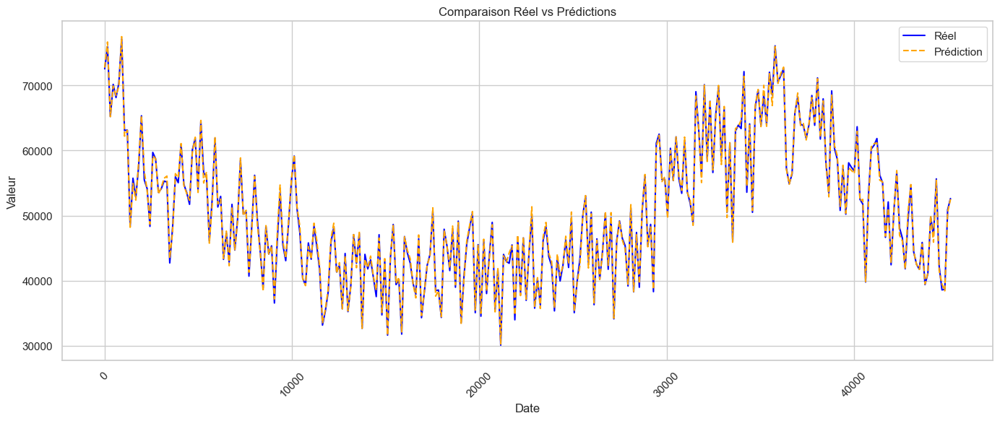

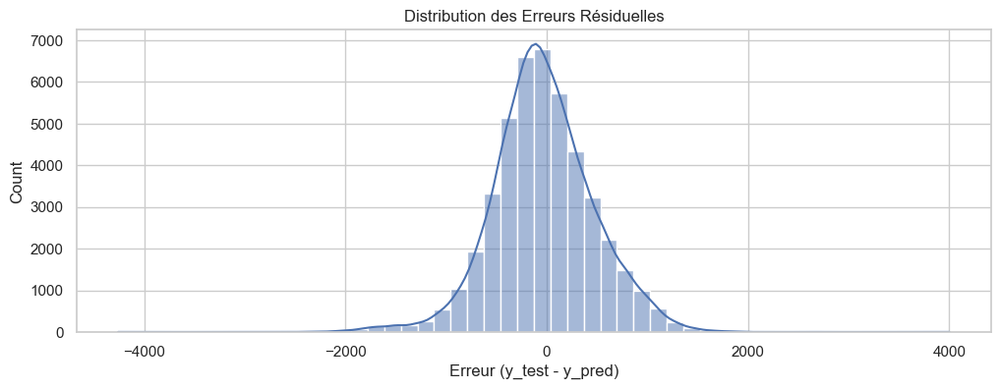


📦 Traitement du modèle : Ridge


[I 2025-04-27 13:16:02,531] Using an existing study with name 'Ridge_Run' instead of creating a new one.
[I 2025-04-27 13:16:02,644] Trial 60 pruned. 
[I 2025-04-27 13:16:02,897] Trial 61 finished with value: 782.699324492359 and parameters: {'alpha': 0.6345743736533871}. Best is trial 51 with value: 782.6992929741439.
[I 2025-04-27 13:16:03,125] Trial 62 finished with value: 782.7006692267958 and parameters: {'alpha': 0.551545552371926}. Best is trial 51 with value: 782.6992929741439.
[I 2025-04-27 13:16:03,203] Trial 63 pruned. 
[I 2025-04-27 13:16:03,286] Trial 64 pruned. 
[I 2025-04-27 13:16:03,368] Trial 65 pruned. 
[I 2025-04-27 13:16:03,455] Trial 66 pruned. 
[I 2025-04-27 13:16:03,573] Trial 67 pruned. 
[I 2025-04-27 13:16:03,655] Trial 68 pruned. 
[I 2025-04-27 13:16:03,737] Trial 69 pruned. 
[I 2025-04-27 13:16:03,820] Trial 70 pruned. 
[I 2025-04-27 13:16:03,938] Trial 71 pruned. 
[I 2025-04-27 13:16:04,159] Trial 72 finished with value: 782.7003584146732 and parameters: {'a

🎯 Meilleurs paramètres trouvés: {'alpha': 0.6120845292082013}



--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 782.6992437953306

--- Résultats pendant Optimisation Optuna ---
Meilleur RMSE trouvé pendant Optuna : 782.6992
🔖 Run sauvegardé dans results.json
❌ RMSE 782.70 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


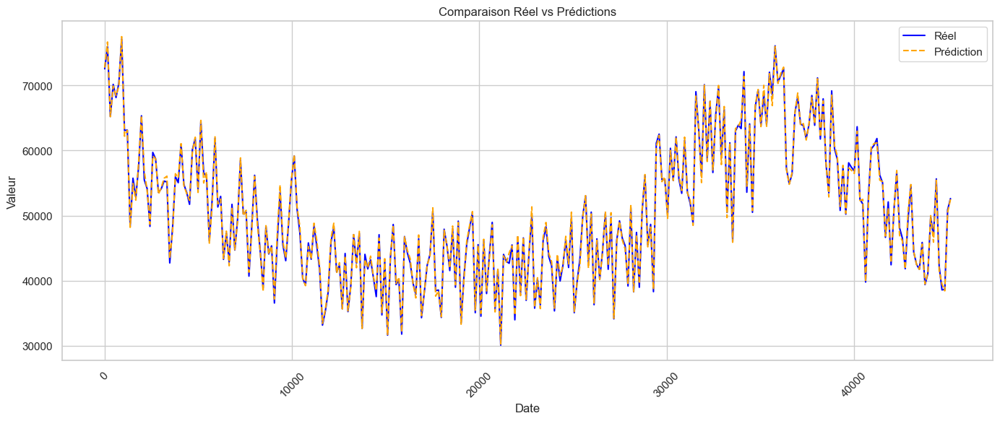

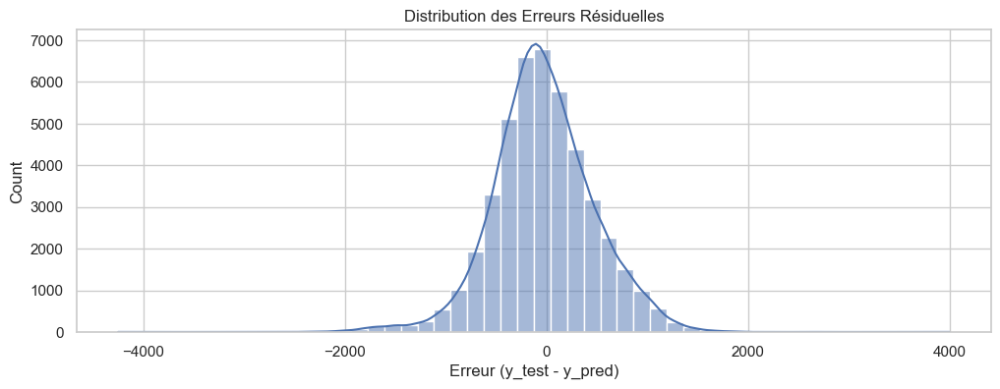


🧠 --- Analyse de l'optimisation Optuna ---



📦 Traitement du modèle : Lasso

[I 2025-04-27 13:16:07,119] Using an existing study with name 'Lasso_Run' instead of creating a new one.


c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.364e+10, tolerance: 3.912e+08

c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.644e+10, tolerance: 8.413e+08

[I 2025-04-27 13:16:18,546] Trial 30 pruned. 
c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing

🎯 Meilleurs paramètres trouvés: {'alpha': 0.00010015184472655845}


c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.368e+10, tolerance: 3.912e+08

c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.651e+10, tolerance: 8.413e+08

c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.778e+10, toler


--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 783.6785221350584

--- Résultats pendant Optimisation Optuna ---
Meilleur RMSE trouvé pendant Optuna : 783.6785
🔖 Run sauvegardé dans results.json
❌ RMSE 783.68 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.128e+10, tolerance: 2.440e+09



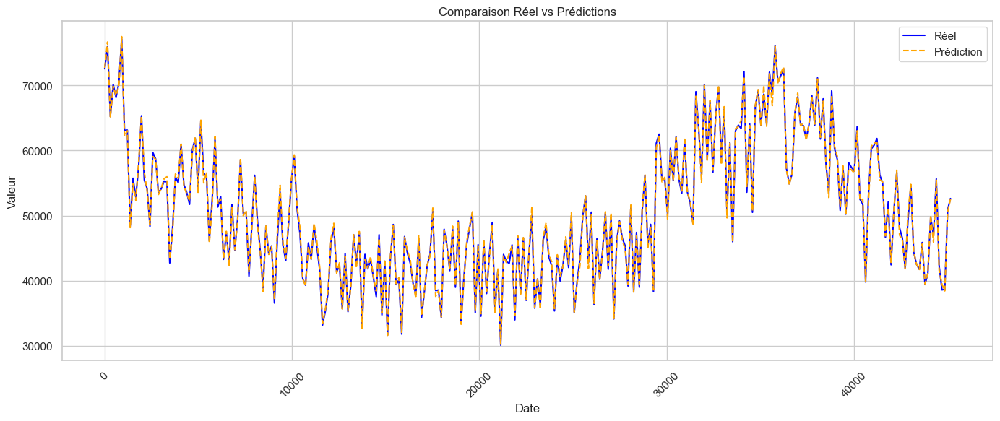

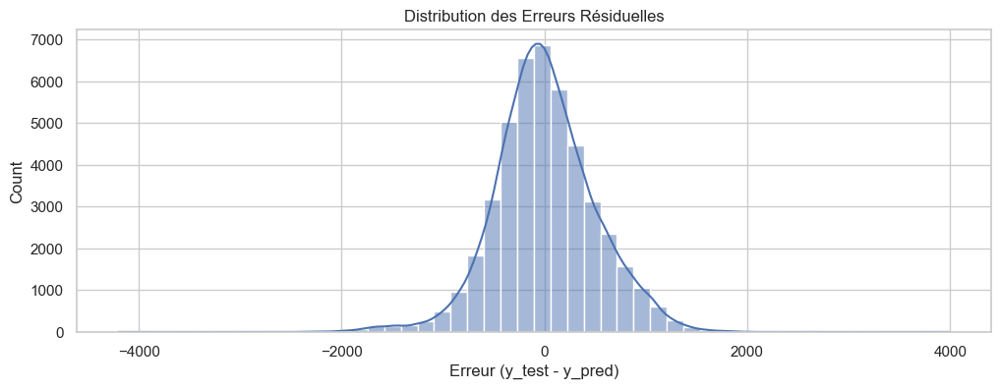


🧠 --- Analyse de l'optimisation Optuna ---


[I 2025-04-27 13:26:20,714] Using an existing study with name 'RandomForest_Run' instead of creating a new one.



📦 Traitement du modèle : RandomForest


[I 2025-04-27 13:36:36,676] Trial 30 finished with value: 541.5173032619418 and parameters: {'n_estimators': 234, 'max_depth': 50, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 1 with value: 539.9567997523067.
[I 2025-04-27 13:46:40,310] Trial 31 finished with value: 541.6130258684386 and parameters: {'n_estimators': 234, 'max_depth': 50, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 1 with value: 539.9567997523067.
[I 2025-04-27 13:56:52,277] Trial 32 finished with value: 541.107872400061 and parameters: {'n_estimators': 236, 'max_depth': 46, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 1 with value: 539.9567997523067.
[I 2025-04-27 13:58:22,854] Trial 33 pruned. 
[I 2025-04-27 14:00:09,848] Trial 34 pruned. 
[I 2025-04-27 14:12:15,658] Trial 35 finished with value: 538.8148413408614 and parameters: {'n_estimators': 242, 'max_depth': 39, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 35 with value: 538.8148413408614.
[I 2

🎯 Meilleurs paramètres trouvés: {'n_estimators': 257, 'max_depth': 26, 'min_samples_split': 2, 'min_samples_leaf': 1}



--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 539.4290886895467

--- Résultats pendant Optimisation Optuna ---
Meilleur RMSE trouvé pendant Optuna : 538.4386
🔖 Run sauvegardé dans results.json
❌ RMSE 539.43 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


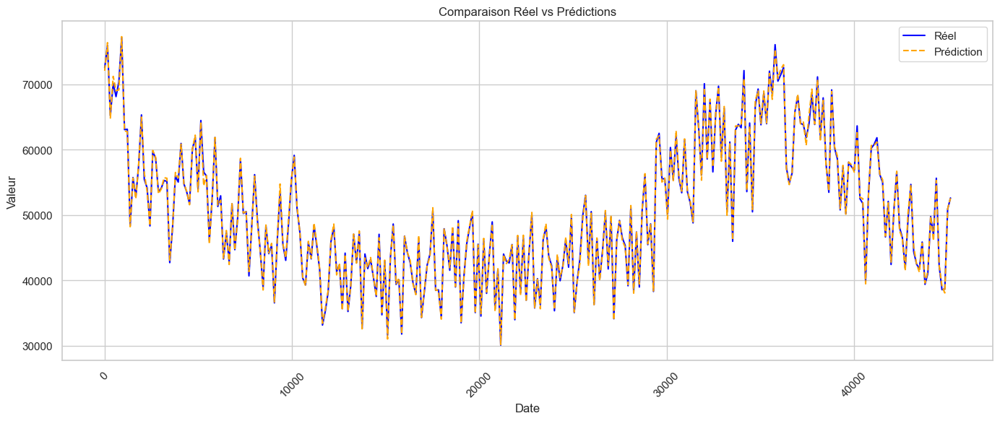

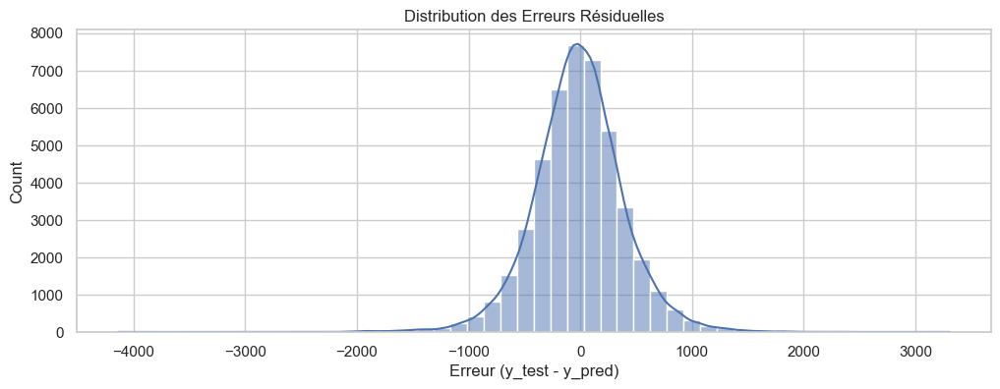


🧠 --- Analyse de l'optimisation Optuna ---


[I 2025-04-27 19:27:16,092] Using an existing study with name 'KNN_Run' instead of creating a new one.



📦 Traitement du modèle : KNN


[I 2025-04-27 19:27:29,448] Trial 30 finished with value: 1437.0473205768794 and parameters: {'n_neighbors': 14, 'weights': 'distance', 'p': 1}. Best is trial 15 with value: 1433.942321090753.
[I 2025-04-27 19:27:32,272] Trial 31 pruned. 
[I 2025-04-27 19:27:35,146] Trial 32 pruned. 
[I 2025-04-27 19:27:38,019] Trial 33 pruned. 
[I 2025-04-27 19:27:40,815] Trial 34 pruned. 
[I 2025-04-27 19:27:43,608] Trial 35 pruned. 
[I 2025-04-27 19:27:46,414] Trial 36 pruned. 
[I 2025-04-27 19:27:47,380] Trial 37 pruned. 
[I 2025-04-27 19:27:50,185] Trial 38 pruned. 
[I 2025-04-27 19:27:51,184] Trial 39 pruned. 
[I 2025-04-27 19:28:04,321] Trial 40 finished with value: 1434.0612062668854 and parameters: {'n_neighbors': 18, 'weights': 'distance', 'p': 1}. Best is trial 15 with value: 1433.942321090753.
[I 2025-04-27 19:28:17,714] Trial 41 finished with value: 1434.0612062668854 and parameters: {'n_neighbors': 18, 'weights': 'distance', 'p': 1}. Best is trial 15 with value: 1433.942321090753.
[I 2025

🎯 Meilleurs paramètres trouvés: {'n_neighbors': 17, 'weights': 'distance', 'p': 1}



--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 1433.942321090753

--- Résultats pendant Optimisation Optuna ---
Meilleur RMSE trouvé pendant Optuna : 1433.9423
🔖 Run sauvegardé dans results.json
❌ RMSE 1433.94 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


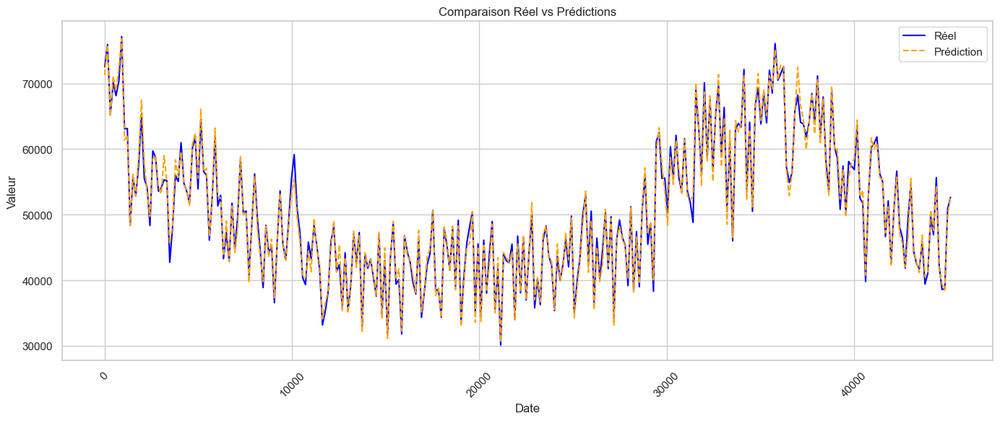

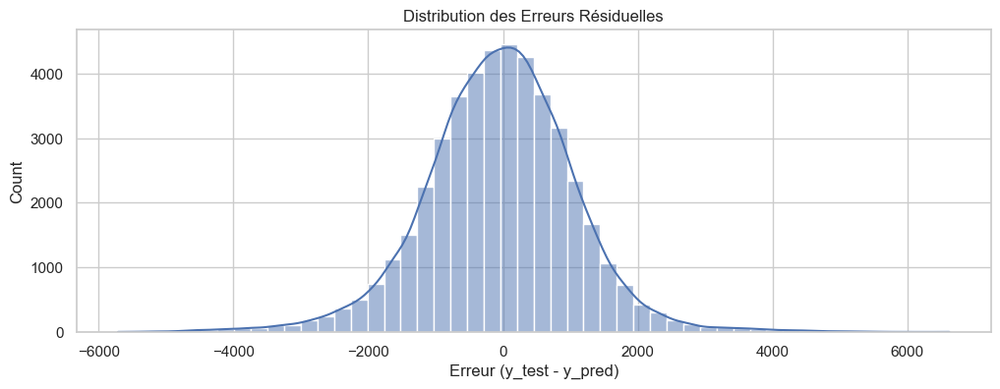


🧠 --- Analyse de l'optimisation Optuna ---


[I 2025-04-27 19:30:58,600] Using an existing study with name 'XGBoost_Run' instead of creating a new one.



📦 Traitement du modèle : XGBoost


[I 2025-04-27 19:30:58,987] Trial 30 pruned. 
[I 2025-04-27 19:31:02,560] Trial 31 finished with value: 567.0657376471519 and parameters: {'n_estimators': 139, 'max_depth': 10, 'learning_rate': 0.08140113340485823, 'subsample': 0.7636604847417158, 'colsample_bytree': 0.9465255095196063}. Best is trial 31 with value: 567.0657376471519.
[I 2025-04-27 19:31:04,816] Trial 32 finished with value: 575.5571234458429 and parameters: {'n_estimators': 167, 'max_depth': 8, 'learning_rate': 0.07321894011448224, 'subsample': 0.7672437690673624, 'colsample_bytree': 0.9406938863339}. Best is trial 31 with value: 567.0657376471519.
[I 2025-04-27 19:31:07,371] Trial 33 finished with value: 572.665826777919 and parameters: {'n_estimators': 144, 'max_depth': 9, 'learning_rate': 0.0983897063382801, 'subsample': 0.7147112561007425, 'colsample_bytree': 0.9076996120902525}. Best is trial 31 with value: 567.0657376471519.
[I 2025-04-27 19:31:08,336] Trial 34 pruned. 
[I 2025-04-27 19:31:13,156] Trial 35 finis

🎯 Meilleurs paramètres trouvés: {'n_estimators': 180, 'max_depth': 10, 'learning_rate': 0.06172031627078686, 'subsample': 0.9018426534201501, 'colsample_bytree': 0.9195843447463513}



--- Résultats Validation Croisée Finale ---
Évaluation du modèle :
Mean RMSE Final: 563.2796954991376

--- Résultats pendant Optimisation Optuna ---
Meilleur RMSE trouvé pendant Optuna : 563.2797
🔖 Run sauvegardé dans results.json
❌ RMSE 563.28 au-dessus du seuil 300, modèle NON sauvegardé.

📈 --- Analyse des prédictions ---


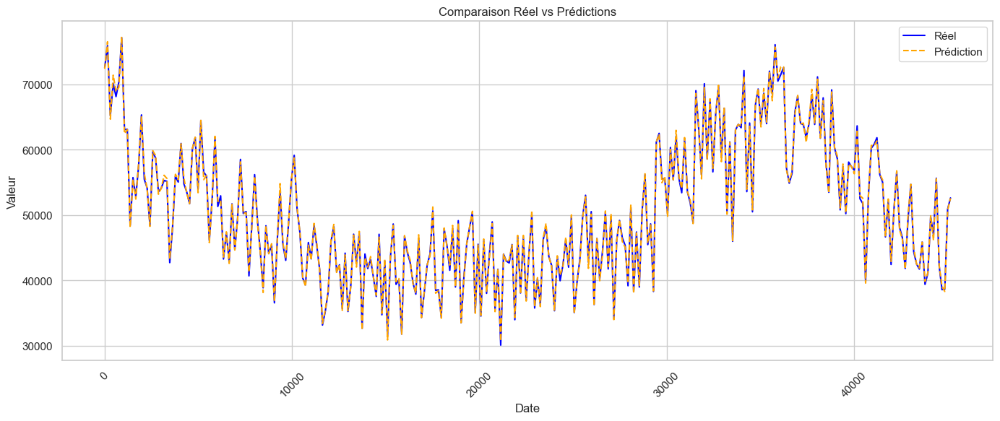

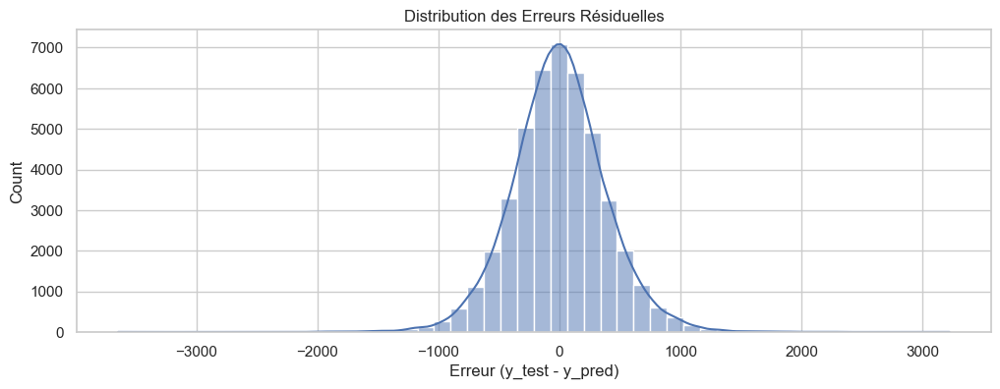


🧠 --- Analyse de l'optimisation Optuna ---


[I 2025-04-27 19:32:50,269] A new study created in RDB with name: LightGBM_Run



📦 Traitement du modèle : LightGBM
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,001034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-27 19:32:54,811] Trial 0 finished with value: 585.943431141344 and parameters: {'n_estimators': 867, 'max_depth': 5, 'learning_rate': 0.11082922677558202, 'subsample': 0.7136281900018362, 'colsample_bytree': 0.6232982336591549, 'num_leaves': 287}. Best is trial 0 with value: 585.943431141344.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,001368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 60208, number of used features: 19
[LightGBM] [Info] Start training from score 54767,227744
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[Lig

[I 2025-04-27 19:32:58,348] Trial 1 finished with value: 1142.6469579507734 and parameters: {'n_estimators': 176, 'max_depth': 9, 'learning_rate': 0.014619457799315642, 'subsample': 0.9880308844531445, 'colsample_bytree': 0.8627164956901894, 'num_leaves': 130}. Best is trial 0 with value: 585.943431141344.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:33:07,628] Trial 2 finished with value: 560.5686089221177 and parameters: {'n_estimators': 472, 'max_depth': 11, 'learning_rate': 0.06488055246692018, 'subsample': 0.6514189157095495, 'colsample_bytree': 0.8370715702570978, 'num_leaves': 282}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:33:11,489] Trial 3 finished with value: 613.55989473897 and parameters: {'n_estimators': 943, 'max_depth': 4, 'learning_rate': 0.05318588561702406, 'subsample': 0.8777154747650384, 'colsample_bytree': 0.8513936009967301, 'num_leaves': 77}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-27 19:33:15,778] Trial 4 finished with value: 574.2492541623478 and parameters: {'n_estimators': 835, 'max_depth': 5, 'learning_rate': 0.09592357364473816, 'subsample': 0.8743638143535133, 'colsample_bytree': 0.8540716570836572, 'num_leaves': 178}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,001231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 60208, number of used features: 19
[LightGBM] [Info] Start training from score 54767,227744
[LightGBM] [Warning]

[I 2025-04-27 19:33:19,485] Trial 5 finished with value: 590.282159671963 and parameters: {'n_estimators': 537, 'max_depth': 11, 'learning_rate': 0.05342068001878048, 'subsample': 0.9689270356916743, 'colsample_bytree': 0.6005812766798361, 'num_leaves': 39}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:33:20,283] Trial 6 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:33:20,813] Trial 7 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 60208, number of used features: 19
[LightGBM] [Info] Start training from score 54767,227744


[I 2025-04-27 19:33:21,450] Trial 8 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:33:22,850] Trial 9 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:33:30,267] Trial 10 finished with value: 568.0755537892097 and parameters: {'n_estimators': 386, 'max_depth': 9, 'learning_rate': 0.029580685481807867, 'subsample': 0.6169124972584079, 'colsample_bytree': 0.9825539699372207, 'num_leaves': 203}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000799 

[I 2025-04-27 19:33:37,736] Trial 11 finished with value: 570.110040284945 and parameters: {'n_estimators': 363, 'max_depth': 9, 'learning_rate': 0.02806815650191392, 'subsample': 0.6153003399407749, 'colsample_bytree': 0.9992950939163517, 'num_leaves': 213}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:33:47,053] Trial 12 finished with value: 562.0332456972902 and parameters: {'n_estimators': 377, 'max_depth': 10, 'learning_rate': 0.032041319720134714, 'subsample': 0.7213373982618796, 'colsample_bytree': 0.9978128448663998, 'num_leaves': 292}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:33:54,863] Trial 13 finished with value: 566.4654374664921 and parameters: {'n_estimators': 387, 'max_depth': 11, 'learning_rate': 0.08181868814608899, 'subsample': 0.719480629657571, 'colsample_bytree': 0.6933560597661618, 'num_leaves': 293}. Best is trial 2 with value: 560.5686089221177.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:34:07,043] Trial 14 finished with value: 552.5663399656668 and parameters: {'n_estimators': 705, 'max_depth': 10, 'learning_rate': 0.03479385450487618, 'subsample': 0.6976858167530989, 'colsample_bytree': 0.9358431217128443, 'num_leaves': 247}. Best is trial 14 with value: 552.5663399656668.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:34:09,054] Trial 15 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:34:22,708] Trial 16 finished with value: 554.763635791883 and parameters: {'n_estimators': 710, 'max_depth': 12, 'learning_rate': 0.04208602036861387, 'subsample': 0.775329661511286, 'colsample_bytree': 0.9167102002176793, 'num_leaves': 248}. Best is trial 14 with value: 552.5663399656668.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,001044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 60208, number of used features: 19
[LightGBM] [Info] Start training from score 54767,227744


[I 2025-04-27 19:34:27,045] Trial 17 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:34:29,117] Trial 18 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:34:42,932] Trial 19 finished with value: 561.7645338707126 and parameters: {'n_estimators': 790, 'max_depth': 10, 'learning_rate': 0.01908628187795941, 'subsample': 0.7588535004848604, 'colsample_bytree': 0.8955502161453308, 'num_leaves': 184}. Best is trial 14 with value: 552.5663399656668.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:34:50,955] Trial 20 finished with value: 546.8996979070182 and parameters: {'n_estimators': 640, 'max_depth': 12, 'learning_rate': 0.04322021009221549, 'subsample': 0.6732048365517356, 'colsample_bytree': 0.9492661234392702, 'num_leaves': 116}. Best is trial 20 with value: 546.8996979070182.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:34:59,251] Trial 21 finished with value: 550.272072703991 and parameters: {'n_estimators': 638, 'max_depth': 12, 'learning_rate': 0.04393345085812475, 'subsample': 0.6728211543044857, 'colsample_bytree': 0.9395486498388559, 'num_leaves': 129}. Best is trial 20 with value: 546.8996979070182.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:35:03,814] Trial 22 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:35:11,027] Trial 23 finished with value: 558.4250809666139 and parameters: {'n_estimators': 627, 'max_depth': 12, 'learning_rate': 0.06787712684105003, 'subsample': 0.6827091200261342, 'colsample_bytree': 0.8072656150135243, 'num_leaves': 113}. Best is trial 20 with value: 546.8996979070182.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:35:21,667] Trial 24 finished with value: 549.9642154269657 and parameters: {'n_estimators': 771, 'max_depth': 11, 'learning_rate': 0.047086485165680814, 'subsample': 0.6759968506320122, 'colsample_bytree': 0.9516713917066313, 'num_leaves': 153}. Best is trial 20 with value: 546.8996979070182.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:35:32,357] Trial 25 finished with value: 554.0597531166293 and parameters: {'n_estimators': 772, 'max_depth': 11, 'learning_rate': 0.04655606317661167, 'subsample': 0.6524172650919692, 'colsample_bytree': 0.8878688988117951, 'num_leaves': 156}. Best is trial 20 with value: 546.8996979070182.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:35:38,578] Trial 26 finished with value: 542.6629673633267 and parameters: {'n_estimators': 588, 'max_depth': 12, 'learning_rate': 0.0720234792122623, 'subsample': 0.7367054957347352, 'colsample_bytree': 0.9581855811878875, 'num_leaves': 93}. Best is trial 26 with value: 542.6629673633267.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,001283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Nu

[I 2025-04-27 19:35:39,297] Trial 27 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0,000635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

[I 2025-04-27 19:35:42,054] Trial 28 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[I 2025-04-27 19:35:42,680] Trial 29 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
🎯 Meilleurs paramètres trouvés: {'n_estimators': 588, 'max_depth': 12, 'learning_rate': 0.0720234792122623, 'subsample': 0.7367054957347352, 'colsample_bytree': 0.9581855811878875, 'num_leaves': 93}


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0,000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 30104, number of used features: 19
[LightGBM] [Info] Start training from score 55504,694326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

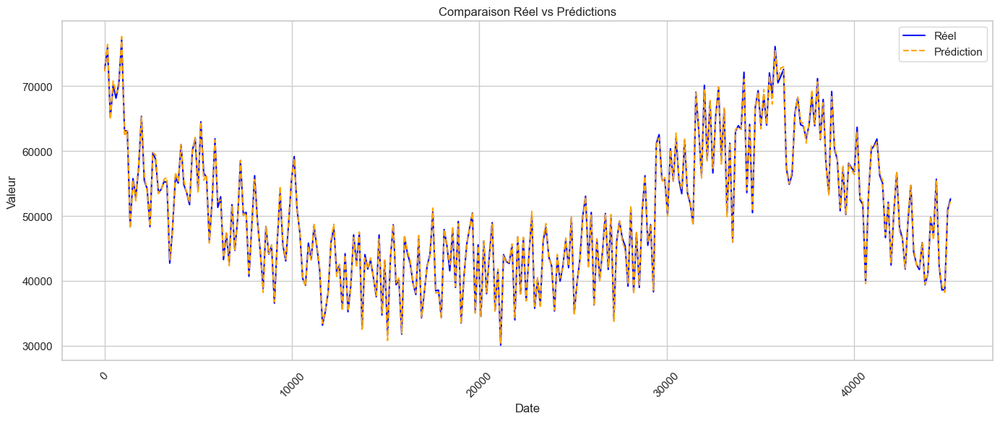

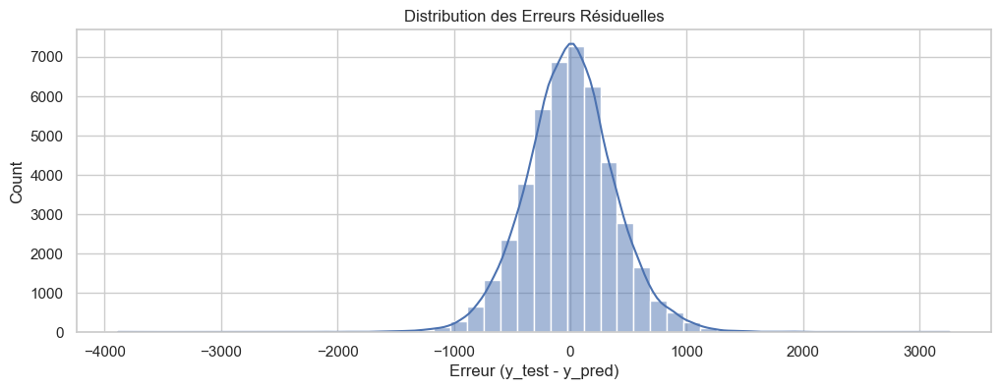


🧠 --- Analyse de l'optimisation Optuna ---



📦 Traitement du modèle : CatBoost

[I 2025-04-27 19:35:51,062] A new study created in RDB with name: CatBoost_Run



0:	learn: 11186.5630203	total: 155ms	remaining: 2m
1:	learn: 10984.8233711	total: 161ms	remaining: 1m 2s
2:	learn: 10775.0878909	total: 167ms	remaining: 43.2s
3:	learn: 10571.8901409	total: 174ms	remaining: 33.6s
4:	learn: 10372.5514543	total: 181ms	remaining: 27.9s
5:	learn: 10177.7009033	total: 187ms	remaining: 24s
6:	learn: 9986.1592336	total: 193ms	remaining: 21.2s
7:	learn: 9797.0274250	total: 199ms	remaining: 19.1s
8:	learn: 9612.5226674	total: 205ms	remaining: 17.5s
9:	learn: 9430.7884825	total: 211ms	remaining: 16.2s
10:	learn: 9254.6848291	total: 216ms	remaining: 15.1s
11:	learn: 9080.5532063	total: 222ms	remaining: 14.2s
12:	learn: 8910.3444409	total: 228ms	remaining: 13.4s
13:	learn: 8742.6229183	total: 234ms	remaining: 12.8s
14:	learn: 8574.1023710	total: 240ms	remaining: 12.2s
15:	learn: 8416.1763281	total: 246ms	remaining: 11.7s
16:	learn: 8259.1852933	total: 252ms	remaining: 11.3s
17:	learn: 8104.7089450	total: 258ms	remaining: 10.9s
18:	learn: 7954.5665000	total: 264ms

[I 2025-04-27 19:36:21,012] Trial 0 finished with value: 674.692847940534 and parameters: {'iterations': 777, 'depth': 9, 'learning_rate': 0.020336013365615472, 'l2_leaf_reg': 4.930015304202392, 'bagging_temperature': 0.5892800327094757}. Best is trial 0 with value: 674.692847940534.


0:	learn: 9400.8093718	total: 3.26ms	remaining: 2.71s
1:	learn: 7789.0754943	total: 5.63ms	remaining: 2.34s
2:	learn: 6470.7673110	total: 8.01ms	remaining: 2.22s
3:	learn: 5402.7599732	total: 10.6ms	remaining: 2.21s
4:	learn: 4522.4517010	total: 13.3ms	remaining: 2.2s
5:	learn: 3803.0178103	total: 15.9ms	remaining: 2.2s
6:	learn: 3234.7714505	total: 18.6ms	remaining: 2.19s
7:	learn: 2788.4465028	total: 20.8ms	remaining: 2.15s
8:	learn: 2447.6555981	total: 23.5ms	remaining: 2.15s
9:	learn: 2173.2655059	total: 26.1ms	remaining: 2.15s
10:	learn: 1939.2062893	total: 28.4ms	remaining: 2.12s
11:	learn: 1753.1026775	total: 31.2ms	remaining: 2.14s
12:	learn: 1597.0843462	total: 33.7ms	remaining: 2.13s
13:	learn: 1480.8855637	total: 36.3ms	remaining: 2.13s
14:	learn: 1390.0209158	total: 38.7ms	remaining: 2.11s
15:	learn: 1322.6950666	total: 41.1ms	remaining: 2.1s
16:	learn: 1261.8017287	total: 43.7ms	remaining: 2.1s
17:	learn: 1207.7863549	total: 46.5ms	remaining: 2.11s
18:	learn: 1170.2874111	

[I 2025-04-27 19:36:37,188] Trial 1 finished with value: 560.3045999556343 and parameters: {'iterations': 834, 'depth': 6, 'learning_rate': 0.19223285657481906, 'l2_leaf_reg': 2.4324038288314505, 'bagging_temperature': 0.3240322746397546}. Best is trial 1 with value: 560.3045999556343.


814:	learn: 445.4657211	total: 4.08s	remaining: 95ms
815:	learn: 445.3846393	total: 4.08s	remaining: 90ms
816:	learn: 445.2657286	total: 4.09s	remaining: 85ms
817:	learn: 445.1167240	total: 4.09s	remaining: 80ms
818:	learn: 445.0548835	total: 4.1s	remaining: 75ms
819:	learn: 444.9842981	total: 4.1s	remaining: 70ms
820:	learn: 444.8852937	total: 4.11s	remaining: 65ms
821:	learn: 444.5676145	total: 4.11s	remaining: 60ms
822:	learn: 444.4625699	total: 4.12s	remaining: 55ms
823:	learn: 444.3753057	total: 4.12s	remaining: 50ms
824:	learn: 444.3251658	total: 4.13s	remaining: 45ms
825:	learn: 444.2691594	total: 4.13s	remaining: 40ms
826:	learn: 444.1239928	total: 4.13s	remaining: 35ms
827:	learn: 444.0372938	total: 4.14s	remaining: 30ms
828:	learn: 443.9544039	total: 4.14s	remaining: 25ms
829:	learn: 443.8476008	total: 4.15s	remaining: 20ms
830:	learn: 443.7749964	total: 4.15s	remaining: 15ms
831:	learn: 443.6899432	total: 4.16s	remaining: 10ms
832:	learn: 443.6176864	total: 4.16s	remaining: 

[I 2025-04-27 19:36:50,753] Trial 2 finished with value: 587.7739277484121 and parameters: {'iterations': 707, 'depth': 6, 'learning_rate': 0.11531847118657527, 'l2_leaf_reg': 7.971034663416685, 'bagging_temperature': 0.5635684513512823}. Best is trial 1 with value: 560.3045999556343.


0:	learn: 11267.5793885	total: 2.03ms	remaining: 2.51s
1:	learn: 11137.6011820	total: 4ms	remaining: 2.47s
2:	learn: 11010.8390745	total: 5.71ms	remaining: 2.35s
3:	learn: 10885.4675779	total: 7.4ms	remaining: 2.28s
4:	learn: 10761.5819668	total: 9.13ms	remaining: 2.25s
5:	learn: 10636.6652311	total: 11.1ms	remaining: 2.27s
6:	learn: 10513.2103598	total: 12.8ms	remaining: 2.25s
7:	learn: 10395.5759398	total: 14.6ms	remaining: 2.24s
8:	learn: 10279.1917338	total: 16.3ms	remaining: 2.22s
9:	learn: 10163.5753931	total: 17.9ms	remaining: 2.2s
10:	learn: 10048.9967542	total: 19.7ms	remaining: 2.19s
11:	learn: 9936.2137040	total: 21.3ms	remaining: 2.18s
12:	learn: 9822.0898249	total: 23.1ms	remaining: 2.17s
13:	learn: 9713.7351254	total: 25ms	remaining: 2.18s
14:	learn: 9607.3546805	total: 26.6ms	remaining: 2.16s
15:	learn: 9497.1930561	total: 28.3ms	remaining: 2.15s
16:	learn: 9390.2503121	total: 30.1ms	remaining: 2.16s
17:	learn: 9285.3039507	total: 31.8ms	remaining: 2.15s
18:	learn: 9178.

[I 2025-04-27 19:37:09,081] Trial 3 finished with value: 716.8175227811338 and parameters: {'iterations': 1236, 'depth': 4, 'learning_rate': 0.012745822637436573, 'l2_leaf_reg': 5.1930254610985145, 'bagging_temperature': 0.19341123166114416}. Best is trial 1 with value: 560.3045999556343.


1234:	learn: 720.2271026	total: 4.86s	remaining: 3.93ms
1235:	learn: 720.1065958	total: 4.86s	remaining: 0us
0:	learn: 9206.6624648	total: 6.19ms	remaining: 4.65s
1:	learn: 7483.6798547	total: 11.9ms	remaining: 4.47s
2:	learn: 6044.7361244	total: 17.8ms	remaining: 4.43s
3:	learn: 4933.0333883	total: 23.9ms	remaining: 4.47s
4:	learn: 4061.5639362	total: 29.6ms	remaining: 4.43s
5:	learn: 3357.6074348	total: 35.6ms	remaining: 4.42s
6:	learn: 2801.2216998	total: 40.7ms	remaining: 4.33s
7:	learn: 2373.7387808	total: 46.6ms	remaining: 4.33s
8:	learn: 2034.7931300	total: 52.3ms	remaining: 4.32s
9:	learn: 1774.7503300	total: 58.1ms	remaining: 4.31s
10:	learn: 1583.0398523	total: 64.4ms	remaining: 4.34s
11:	learn: 1440.8333774	total: 70.8ms	remaining: 4.37s
12:	learn: 1332.0637229	total: 79.3ms	remaining: 4.51s
13:	learn: 1246.0552196	total: 87.5ms	remaining: 4.61s
14:	learn: 1181.0137986	total: 96.6ms	remaining: 4.75s
15:	learn: 1131.0101603	total: 105ms	remaining: 4.82s
16:	learn: 1084.621311

[I 2025-04-27 19:37:36,823] Trial 4 finished with value: 591.4306951467473 and parameters: {'iterations': 752, 'depth': 9, 'learning_rate': 0.21123496739968994, 'l2_leaf_reg': 6.7177942788102385, 'bagging_temperature': 0.8831201474881734}. Best is trial 1 with value: 560.3045999556343.


748:	learn: 374.4388497	total: 6.36s	remaining: 25.5ms
749:	learn: 374.3459284	total: 6.37s	remaining: 17ms
750:	learn: 374.2666156	total: 6.38s	remaining: 8.49ms
751:	learn: 374.2192135	total: 6.38s	remaining: 0us
0:	learn: 10032.0237741	total: 6.68ms	remaining: 7.68s
1:	learn: 8876.4437495	total: 12.8ms	remaining: 7.36s
2:	learn: 7822.8029929	total: 18.7ms	remaining: 7.16s
3:	learn: 6898.5730975	total: 24.5ms	remaining: 7.04s
4:	learn: 6107.9234977	total: 30.3ms	remaining: 6.96s
5:	learn: 5402.0302144	total: 37ms	remaining: 7.06s
6:	learn: 4770.9963649	total: 42.3ms	remaining: 6.92s
7:	learn: 4236.4695677	total: 48.6ms	remaining: 6.95s
8:	learn: 3779.5403998	total: 55.2ms	remaining: 7.01s
9:	learn: 3374.4866334	total: 61.4ms	remaining: 7.01s
10:	learn: 3031.4299470	total: 68.2ms	remaining: 7.08s
11:	learn: 2737.0529797	total: 74ms	remaining: 7.03s
12:	learn: 2480.6261303	total: 80.6ms	remaining: 7.06s
13:	learn: 2240.5009303	total: 86.9ms	remaining: 7.06s
14:	learn: 2033.6243737	tota

[I 2025-04-27 19:38:19,370] Trial 5 finished with value: 589.4126766898801 and parameters: {'iterations': 1152, 'depth': 9, 'learning_rate': 0.13008027658727617, 'l2_leaf_reg': 1.9190022193096143, 'bagging_temperature': 0.9514608351039722}. Best is trial 1 with value: 560.3045999556343.


1149:	learn: 363.0257787	total: 9.98s	remaining: 17.4ms
1150:	learn: 362.9838413	total: 9.99s	remaining: 8.68ms
1151:	learn: 362.8967957	total: 9.99s	remaining: 0us
0:	learn: 9621.3465261	total: 3.61ms	remaining: 4.68s
1:	learn: 8148.2683658	total: 6.98ms	remaining: 4.52s
2:	learn: 6905.9273671	total: 10.5ms	remaining: 4.52s
3:	learn: 5844.4646233	total: 14ms	remaining: 4.52s
4:	learn: 4977.0562460	total: 17.1ms	remaining: 4.41s
5:	learn: 4277.7529581	total: 20.5ms	remaining: 4.4s
6:	learn: 3695.2370126	total: 23.5ms	remaining: 4.34s
7:	learn: 3205.8067602	total: 26.6ms	remaining: 4.29s
8:	learn: 2807.8907763	total: 29.9ms	remaining: 4.28s
9:	learn: 2468.8996535	total: 33.1ms	remaining: 4.26s
10:	learn: 2200.6642313	total: 36.5ms	remaining: 4.26s
11:	learn: 1984.2393419	total: 39.6ms	remaining: 4.25s
12:	learn: 1808.8840392	total: 42.9ms	remaining: 4.24s
13:	learn: 1658.2397221	total: 46.3ms	remaining: 4.25s
14:	learn: 1531.6507038	total: 50.2ms	remaining: 4.29s
15:	learn: 1418.9663151

[I 2025-04-27 19:38:47,965] Trial 6 finished with value: 555.8004852641403 and parameters: {'iterations': 1298, 'depth': 7, 'learning_rate': 0.17153395539262828, 'l2_leaf_reg': 7.407331396763385, 'bagging_temperature': 0.7429301838165877}. Best is trial 6 with value: 555.8004852641403.


0:	learn: 10089.8189390	total: 2.18ms	remaining: 1.57s
1:	learn: 8950.3004285	total: 3.99ms	remaining: 1.43s
2:	learn: 7958.6042092	total: 5.96ms	remaining: 1.43s
3:	learn: 7069.6183338	total: 7.94ms	remaining: 1.42s
4:	learn: 6301.0511397	total: 9.84ms	remaining: 1.41s
5:	learn: 5622.2306806	total: 12ms	remaining: 1.43s
6:	learn: 5021.4127843	total: 14.3ms	remaining: 1.46s
7:	learn: 4508.6513055	total: 16.3ms	remaining: 1.45s
8:	learn: 4058.2971926	total: 18.1ms	remaining: 1.43s
9:	learn: 3668.2517113	total: 20.1ms	remaining: 1.43s
10:	learn: 3329.5455101	total: 22.3ms	remaining: 1.44s
11:	learn: 3028.5293649	total: 24.7ms	remaining: 1.46s
12:	learn: 2770.8828503	total: 27.6ms	remaining: 1.5s
13:	learn: 2545.0137399	total: 30.2ms	remaining: 1.52s
14:	learn: 2353.7073831	total: 32.3ms	remaining: 1.52s
15:	learn: 2186.3995647	total: 34.6ms	remaining: 1.52s
16:	learn: 2041.6179134	total: 36.3ms	remaining: 1.5s
17:	learn: 1920.5815796	total: 38.1ms	remaining: 1.49s
18:	learn: 1815.9827142

[I 2025-04-27 19:38:53,574] Trial 7 pruned. 


693:	learn: 577.0297666	total: 1.99s	remaining: 77.4ms
694:	learn: 576.9784637	total: 1.99s	remaining: 74.5ms
695:	learn: 576.4972954	total: 2s	remaining: 71.7ms
696:	learn: 576.4039952	total: 2s	remaining: 68.8ms
697:	learn: 576.1895719	total: 2s	remaining: 65.9ms
698:	learn: 576.1183533	total: 2s	remaining: 63ms
699:	learn: 575.6319082	total: 2.01s	remaining: 60.2ms
700:	learn: 575.5526738	total: 2.01s	remaining: 57.3ms
701:	learn: 575.4919811	total: 2.01s	remaining: 54.5ms
702:	learn: 575.2920954	total: 2.01s	remaining: 51.6ms
703:	learn: 574.9560692	total: 2.02s	remaining: 48.7ms
704:	learn: 574.8980168	total: 2.02s	remaining: 45.8ms
705:	learn: 574.8002169	total: 2.02s	remaining: 43ms
706:	learn: 574.5233011	total: 2.02s	remaining: 40.1ms
707:	learn: 574.2048631	total: 2.03s	remaining: 37.2ms
708:	learn: 574.0717624	total: 2.03s	remaining: 34.4ms
709:	learn: 573.9454026	total: 2.03s	remaining: 31.5ms
710:	learn: 573.7569383	total: 2.04s	remaining: 28.7ms
711:	learn: 573.6699736	to

[I 2025-04-27 19:39:18,979] Trial 8 pruned. 


1032:	learn: 627.9517082	total: 13.1s	remaining: 12.7ms
1033:	learn: 627.8773515	total: 13.2s	remaining: 0us
0:	learn: 9267.3411172	total: 2.57ms	remaining: 3.61s
1:	learn: 7586.1581050	total: 4.61ms	remaining: 3.23s
2:	learn: 6220.9862328	total: 6.66ms	remaining: 3.11s
3:	learn: 5128.7546692	total: 8.75ms	remaining: 3.06s
4:	learn: 4284.7500863	total: 10.8ms	remaining: 3.03s
5:	learn: 3616.6585031	total: 12.9ms	remaining: 3s
6:	learn: 3081.0422412	total: 15ms	remaining: 2.99s
7:	learn: 2660.0593663	total: 16.8ms	remaining: 2.94s
8:	learn: 2349.6121257	total: 18.8ms	remaining: 2.91s
9:	learn: 2079.1066211	total: 21.2ms	remaining: 2.96s
10:	learn: 1885.0674041	total: 23.2ms	remaining: 2.94s
11:	learn: 1730.7368431	total: 25.1ms	remaining: 2.92s
12:	learn: 1606.6544018	total: 27.3ms	remaining: 2.92s
13:	learn: 1517.6752718	total: 29.6ms	remaining: 2.94s
14:	learn: 1424.5189412	total: 31.8ms	remaining: 2.94s
15:	learn: 1361.8126593	total: 33.7ms	remaining: 2.93s
16:	learn: 1308.4867376	to

[I 2025-04-27 19:39:40,935] Trial 9 finished with value: 571.1050036184489 and parameters: {'iterations': 1405, 'depth': 4, 'learning_rate': 0.20727895198608595, 'l2_leaf_reg': 7.58576549276897, 'bagging_temperature': 0.3825465651395227}. Best is trial 6 with value: 555.8004852641403.


1379:	learn: 471.4510120	total: 5.68s	remaining: 103ms
1380:	learn: 471.4073609	total: 5.69s	remaining: 98.9ms
1381:	learn: 471.3473777	total: 5.69s	remaining: 94.7ms
1382:	learn: 471.3008763	total: 5.7s	remaining: 90.6ms
1383:	learn: 471.2713814	total: 5.7s	remaining: 86.5ms
1384:	learn: 471.2013155	total: 5.71s	remaining: 82.4ms
1385:	learn: 471.1613563	total: 5.71s	remaining: 78.3ms
1386:	learn: 471.1323876	total: 5.71s	remaining: 74.1ms
1387:	learn: 470.9971323	total: 5.72s	remaining: 70ms
1388:	learn: 470.9667635	total: 5.72s	remaining: 65.9ms
1389:	learn: 470.8725908	total: 5.72s	remaining: 61.8ms
1390:	learn: 470.7979793	total: 5.73s	remaining: 57.7ms
1391:	learn: 470.7019122	total: 5.73s	remaining: 53.5ms
1392:	learn: 470.6297624	total: 5.74s	remaining: 49.4ms
1393:	learn: 470.5774699	total: 5.74s	remaining: 45.3ms
1394:	learn: 470.4057818	total: 5.74s	remaining: 41.2ms
1395:	learn: 470.3659986	total: 5.75s	remaining: 37.1ms
1396:	learn: 470.3116559	total: 5.75s	remaining: 32.9

[I 2025-04-27 19:39:43,360] Trial 10 pruned. 


270:	learn: 703.1916458	total: 1.01s	remaining: 172ms
271:	learn: 702.9317710	total: 1.02s	remaining: 168ms
272:	learn: 701.8799036	total: 1.02s	remaining: 164ms
273:	learn: 701.4096789	total: 1.02s	remaining: 161ms
274:	learn: 700.8088468	total: 1.03s	remaining: 157ms
275:	learn: 700.3249509	total: 1.03s	remaining: 153ms
276:	learn: 699.7478875	total: 1.03s	remaining: 149ms
277:	learn: 699.2350380	total: 1.04s	remaining: 146ms
278:	learn: 698.2158886	total: 1.04s	remaining: 142ms
279:	learn: 697.7431943	total: 1.05s	remaining: 138ms
280:	learn: 697.3560722	total: 1.05s	remaining: 135ms
281:	learn: 696.7600408	total: 1.05s	remaining: 131ms
282:	learn: 696.3975681	total: 1.06s	remaining: 127ms
283:	learn: 696.0625225	total: 1.06s	remaining: 123ms
284:	learn: 695.7671719	total: 1.06s	remaining: 120ms
285:	learn: 695.2560245	total: 1.07s	remaining: 116ms
286:	learn: 694.4898015	total: 1.07s	remaining: 112ms
287:	learn: 693.7198502	total: 1.07s	remaining: 108ms
288:	learn: 693.2207499	tota

[I 2025-04-27 19:40:13,253] Trial 11 finished with value: 567.3353180699535 and parameters: {'iterations': 1497, 'depth': 6, 'learning_rate': 0.2853349699174227, 'l2_leaf_reg': 1.2538956550746239, 'bagging_temperature': 0.13107694821700722}. Best is trial 6 with value: 555.8004852641403.


1492:	learn: 359.2377160	total: 7.78s	remaining: 20.9ms
1493:	learn: 359.1540844	total: 7.79s	remaining: 15.6ms
1494:	learn: 359.1151062	total: 7.79s	remaining: 10.4ms
1495:	learn: 359.0742284	total: 7.8s	remaining: 5.21ms
1496:	learn: 358.9580630	total: 7.8s	remaining: 0us
0:	learn: 10736.5701471	total: 2.83ms	remaining: 1.24s
1:	learn: 10140.5363554	total: 5.28ms	remaining: 1.15s
2:	learn: 9551.8404095	total: 8.27ms	remaining: 1.2s
3:	learn: 8993.2873494	total: 11ms	remaining: 1.19s
4:	learn: 8491.5644561	total: 13.8ms	remaining: 1.19s
5:	learn: 7995.6760254	total: 16.5ms	remaining: 1.18s
6:	learn: 7536.8042335	total: 19.1ms	remaining: 1.17s
7:	learn: 7113.3850938	total: 21.7ms	remaining: 1.16s
8:	learn: 6719.1436847	total: 23.9ms	remaining: 1.14s
9:	learn: 6353.1825568	total: 26.2ms	remaining: 1.12s
10:	learn: 6003.3444415	total: 29.1ms	remaining: 1.13s
11:	learn: 5675.7803365	total: 31.5ms	remaining: 1.12s
12:	learn: 5370.9762946	total: 34.1ms	remaining: 1.11s
13:	learn: 5077.19999

[I 2025-04-27 19:40:16,011] Trial 12 pruned. 


404:	learn: 621.0566774	total: 1.27s	remaining: 100ms
405:	learn: 620.6285955	total: 1.27s	remaining: 97.2ms
406:	learn: 620.3366661	total: 1.28s	remaining: 94.1ms
407:	learn: 619.9827459	total: 1.28s	remaining: 91ms
408:	learn: 619.8231042	total: 1.28s	remaining: 87.8ms
409:	learn: 619.5594784	total: 1.29s	remaining: 84.7ms
410:	learn: 619.2555920	total: 1.29s	remaining: 81.6ms
411:	learn: 618.8630025	total: 1.29s	remaining: 78.5ms
412:	learn: 618.7037465	total: 1.3s	remaining: 75.3ms
413:	learn: 618.3983659	total: 1.3s	remaining: 72.2ms
414:	learn: 618.1781329	total: 1.3s	remaining: 69.1ms
415:	learn: 617.9310645	total: 1.31s	remaining: 65.9ms
416:	learn: 617.5815006	total: 1.31s	remaining: 62.8ms
417:	learn: 617.4528629	total: 1.31s	remaining: 59.6ms
418:	learn: 617.0465420	total: 1.31s	remaining: 56.5ms
419:	learn: 616.6714731	total: 1.32s	remaining: 53.4ms
420:	learn: 616.4775098	total: 1.32s	remaining: 50.2ms
421:	learn: 616.2161045	total: 1.32s	remaining: 47.1ms
422:	learn: 615.

[I 2025-04-27 19:40:32,510] Trial 13 pruned. 


956:	learn: 497.8235891	total: 4.72s	remaining: 29.6ms
957:	learn: 497.7436371	total: 4.72s	remaining: 24.6ms
958:	learn: 497.6590387	total: 4.73s	remaining: 19.7ms
959:	learn: 497.6062285	total: 4.73s	remaining: 14.8ms
960:	learn: 497.4995070	total: 4.74s	remaining: 9.86ms
961:	learn: 497.3670174	total: 4.74s	remaining: 4.93ms
962:	learn: 497.2964286	total: 4.75s	remaining: 0us
0:	learn: 10449.8919210	total: 2.64ms	remaining: 1.41s
1:	learn: 9587.5914185	total: 4.68ms	remaining: 1.25s
2:	learn: 8779.4200303	total: 6.58ms	remaining: 1.16s
3:	learn: 8070.0696431	total: 8.61ms	remaining: 1.14s
4:	learn: 7405.0687412	total: 10.7ms	remaining: 1.13s
5:	learn: 6812.9148602	total: 12.8ms	remaining: 1.12s
6:	learn: 6273.3084436	total: 14.8ms	remaining: 1.11s
7:	learn: 5772.9141714	total: 16.8ms	remaining: 1.1s
8:	learn: 5321.3700316	total: 19ms	remaining: 1.11s
9:	learn: 4913.0824040	total: 21.2ms	remaining: 1.11s
10:	learn: 4544.3266772	total: 23.3ms	remaining: 1.11s
11:	learn: 4217.5440219	t

[I 2025-04-27 19:40:35,505] Trial 14 pruned. 


498:	learn: 600.7624176	total: 1.4s	remaining: 98.5ms
499:	learn: 600.4428209	total: 1.41s	remaining: 95.7ms
500:	learn: 599.9491195	total: 1.41s	remaining: 92.8ms
501:	learn: 599.7783606	total: 1.41s	remaining: 90ms
502:	learn: 599.6886392	total: 1.41s	remaining: 87.2ms
503:	learn: 599.3839191	total: 1.42s	remaining: 84.4ms
504:	learn: 599.1761321	total: 1.42s	remaining: 81.6ms
505:	learn: 598.8896207	total: 1.42s	remaining: 78.8ms
506:	learn: 598.6373655	total: 1.43s	remaining: 76ms
507:	learn: 598.3529440	total: 1.43s	remaining: 73.2ms
508:	learn: 598.1817112	total: 1.43s	remaining: 70.4ms
509:	learn: 597.9935435	total: 1.44s	remaining: 67.5ms
510:	learn: 597.8706071	total: 1.44s	remaining: 64.7ms
511:	learn: 597.5850852	total: 1.44s	remaining: 61.9ms
512:	learn: 597.5062335	total: 1.44s	remaining: 59.1ms
513:	learn: 597.3960688	total: 1.45s	remaining: 56.3ms
514:	learn: 597.1548928	total: 1.45s	remaining: 53.5ms
515:	learn: 596.9268747	total: 1.45s	remaining: 50.7ms
516:	learn: 596

[I 2025-04-27 19:40:47,322] Trial 15 pruned. 


0:	learn: 8385.2672851	total: 3.86ms	remaining: 4.17s
1:	learn: 6220.1961767	total: 8ms	remaining: 4.31s
2:	learn: 4655.5820196	total: 11.5ms	remaining: 4.13s
3:	learn: 3529.0299271	total: 15.5ms	remaining: 4.17s
4:	learn: 2712.4245928	total: 19.4ms	remaining: 4.18s
5:	learn: 2170.2385652	total: 23ms	remaining: 4.12s
6:	learn: 1783.4990186	total: 27.3ms	remaining: 4.19s
7:	learn: 1524.8955043	total: 31.5ms	remaining: 4.22s
8:	learn: 1366.5347834	total: 35.6ms	remaining: 4.23s
9:	learn: 1263.6709041	total: 39.6ms	remaining: 4.24s
10:	learn: 1191.1051513	total: 44.1ms	remaining: 4.29s
11:	learn: 1136.6375731	total: 48.1ms	remaining: 4.28s
12:	learn: 1095.6816039	total: 51.9ms	remaining: 4.26s
13:	learn: 1065.1999818	total: 56.1ms	remaining: 4.27s
14:	learn: 1043.9773223	total: 60.5ms	remaining: 4.3s
15:	learn: 1027.9061115	total: 65.2ms	remaining: 4.33s
16:	learn: 1014.1114487	total: 69.9ms	remaining: 4.37s
17:	learn: 998.4707017	total: 74.9ms	remaining: 4.42s
18:	learn: 981.7130578	tota

[I 2025-04-27 19:40:57,558] Trial 16 pruned. 


1063:	learn: 309.9651473	total: 5.06s	remaining: 76.1ms
1064:	learn: 309.8890157	total: 5.07s	remaining: 71.3ms
1065:	learn: 309.7338319	total: 5.07s	remaining: 66.6ms
1066:	learn: 309.5908777	total: 5.07s	remaining: 61.8ms
1067:	learn: 309.4910771	total: 5.08s	remaining: 57.1ms
1068:	learn: 309.3530121	total: 5.08s	remaining: 52.3ms
1069:	learn: 309.2600481	total: 5.09s	remaining: 47.6ms
1070:	learn: 309.2128459	total: 5.09s	remaining: 42.8ms
1071:	learn: 309.1479963	total: 5.1s	remaining: 38.1ms
1072:	learn: 309.0186658	total: 5.1s	remaining: 33.3ms
1073:	learn: 308.7997729	total: 5.11s	remaining: 28.5ms
1074:	learn: 308.7387533	total: 5.11s	remaining: 23.8ms
1075:	learn: 308.6883111	total: 5.12s	remaining: 19ms
1076:	learn: 308.5104648	total: 5.12s	remaining: 14.3ms
1077:	learn: 308.4465432	total: 5.13s	remaining: 9.51ms
1078:	learn: 308.3314622	total: 5.13s	remaining: 4.75ms
1079:	learn: 308.2232738	total: 5.14s	remaining: 0us
0:	learn: 9604.7995207	total: 2.45ms	remaining: 2.25s
1

[I 2025-04-27 19:41:13,759] Trial 17 finished with value: 570.1047992179635 and parameters: {'iterations': 919, 'depth': 5, 'learning_rate': 0.17364744723843759, 'l2_leaf_reg': 3.395407889454851, 'bagging_temperature': 0.04223548066084304}. Best is trial 6 with value: 555.8004852641403.


894:	learn: 478.5534591	total: 4.14s	remaining: 111ms
895:	learn: 478.4203164	total: 4.14s	remaining: 106ms
896:	learn: 478.3449457	total: 4.15s	remaining: 102ms
897:	learn: 478.2649224	total: 4.16s	remaining: 97.2ms
898:	learn: 478.1927381	total: 4.16s	remaining: 92.5ms
899:	learn: 478.1490812	total: 4.16s	remaining: 87.9ms
900:	learn: 478.1062005	total: 4.17s	remaining: 83.3ms
901:	learn: 477.9676019	total: 4.17s	remaining: 78.7ms
902:	learn: 477.9119228	total: 4.18s	remaining: 74ms
903:	learn: 477.8362082	total: 4.18s	remaining: 69.4ms
904:	learn: 477.7080967	total: 4.19s	remaining: 64.8ms
905:	learn: 477.6500131	total: 4.19s	remaining: 60.1ms
906:	learn: 477.5924080	total: 4.2s	remaining: 55.5ms
907:	learn: 477.4940974	total: 4.2s	remaining: 50.9ms
908:	learn: 477.4223073	total: 4.2s	remaining: 46.3ms
909:	learn: 477.3322785	total: 4.21s	remaining: 41.6ms
910:	learn: 477.2480521	total: 4.21s	remaining: 37ms
911:	learn: 477.1376309	total: 4.22s	remaining: 32.4ms
912:	learn: 477.0778

[I 2025-04-27 19:41:19,290] Trial 18 pruned. 


0:	learn: 10954.1003740	total: 2.52ms	remaining: 2.17s
1:	learn: 10527.7571084	total: 4.74ms	remaining: 2.04s
2:	learn: 10109.9608182	total: 6.91ms	remaining: 1.98s
3:	learn: 9720.5744305	total: 9.04ms	remaining: 1.94s
4:	learn: 9341.6132075	total: 11.2ms	remaining: 1.92s
5:	learn: 8987.3815065	total: 13.4ms	remaining: 1.91s
6:	learn: 8641.8961199	total: 15.6ms	remaining: 1.91s
7:	learn: 8305.0839500	total: 17.8ms	remaining: 1.9s
8:	learn: 7983.9369680	total: 19.7ms	remaining: 1.87s
9:	learn: 7685.9615368	total: 22ms	remaining: 1.88s
10:	learn: 7396.3967044	total: 24.3ms	remaining: 1.88s
11:	learn: 7119.7861765	total: 26.6ms	remaining: 1.89s
12:	learn: 6852.5950848	total: 28.7ms	remaining: 1.87s
13:	learn: 6601.1274267	total: 31.1ms	remaining: 1.89s
14:	learn: 6349.6849265	total: 33.3ms	remaining: 1.88s
15:	learn: 6119.8855199	total: 35.4ms	remaining: 1.87s
16:	learn: 5894.5190797	total: 37.8ms	remaining: 1.88s
17:	learn: 5676.0400863	total: 40ms	remaining: 1.87s
18:	learn: 5468.694838

[I 2025-04-27 19:41:23,861] Trial 19 pruned. 


0:	learn: 9486.3007836	total: 3.63ms	remaining: 4.83s
1:	learn: 7926.8106312	total: 6.8ms	remaining: 4.52s
2:	learn: 6632.5687914	total: 9.88ms	remaining: 4.38s
3:	learn: 5527.9671747	total: 13.2ms	remaining: 4.39s
4:	learn: 4670.5264229	total: 16.7ms	remaining: 4.43s
5:	learn: 3980.3053237	total: 19.9ms	remaining: 4.4s
6:	learn: 3398.4701711	total: 23.4ms	remaining: 4.42s
7:	learn: 2928.9220767	total: 26.3ms	remaining: 4.34s
8:	learn: 2564.1771581	total: 29.1ms	remaining: 4.28s
9:	learn: 2254.0561167	total: 32.1ms	remaining: 4.23s
10:	learn: 2010.8707758	total: 35.9ms	remaining: 4.31s
11:	learn: 1810.7290560	total: 38.9ms	remaining: 4.28s
12:	learn: 1646.1851908	total: 42.2ms	remaining: 4.28s
13:	learn: 1506.3198402	total: 45.1ms	remaining: 4.24s
14:	learn: 1397.7895585	total: 48.1ms	remaining: 4.22s
15:	learn: 1310.4564233	total: 51.2ms	remaining: 4.21s
16:	learn: 1245.5281565	total: 54.4ms	remaining: 4.2s
17:	learn: 1192.9828416	total: 57.4ms	remaining: 4.18s
18:	learn: 1145.0349842

[I 2025-04-27 19:41:54,517] Trial 20 finished with value: 553.8731698427952 and parameters: {'iterations': 1331, 'depth': 7, 'learning_rate': 0.1848735472004614, 'l2_leaf_reg': 8.641659308300657, 'bagging_temperature': 0.451098696509611}. Best is trial 20 with value: 553.8731698427952.


1319:	learn: 387.3653977	total: 7.81s	remaining: 65.1ms
1320:	learn: 387.2677841	total: 7.82s	remaining: 59.2ms
1321:	learn: 387.1875543	total: 7.82s	remaining: 53.3ms
1322:	learn: 387.1561329	total: 7.83s	remaining: 47.3ms
1323:	learn: 387.1280248	total: 7.83s	remaining: 41.4ms
1324:	learn: 387.0758309	total: 7.84s	remaining: 35.5ms
1325:	learn: 387.0454000	total: 7.84s	remaining: 29.6ms
1326:	learn: 386.9698902	total: 7.85s	remaining: 23.7ms
1327:	learn: 386.9434804	total: 7.86s	remaining: 17.7ms
1328:	learn: 386.9228127	total: 7.86s	remaining: 11.8ms
1329:	learn: 386.7393605	total: 7.87s	remaining: 5.92ms
1330:	learn: 386.6383287	total: 7.87s	remaining: 0us
0:	learn: 9568.8622699	total: 3.46ms	remaining: 4.53s
1:	learn: 8062.2336319	total: 6.56ms	remaining: 4.3s
2:	learn: 6798.8589129	total: 9.79ms	remaining: 4.27s
3:	learn: 5711.5578477	total: 12.9ms	remaining: 4.23s
4:	learn: 4856.5086844	total: 16.3ms	remaining: 4.26s
5:	learn: 4185.3072837	total: 19.7ms	remaining: 4.29s
6:	learn

[I 2025-04-27 19:42:24,499] Trial 21 finished with value: 555.7754862396504 and parameters: {'iterations': 1313, 'depth': 7, 'learning_rate': 0.17683899719481655, 'l2_leaf_reg': 8.784858304340494, 'bagging_temperature': 0.4423270170835267}. Best is trial 20 with value: 553.8731698427952.


1300:	learn: 392.9911406	total: 7.44s	remaining: 68.6ms
1301:	learn: 392.9694304	total: 7.45s	remaining: 62.9ms
1302:	learn: 392.9048053	total: 7.45s	remaining: 57.2ms
1303:	learn: 392.8218665	total: 7.46s	remaining: 51.5ms
1304:	learn: 392.7404497	total: 7.46s	remaining: 45.8ms
1305:	learn: 392.6284956	total: 7.47s	remaining: 40ms
1306:	learn: 392.5761794	total: 7.48s	remaining: 34.3ms
1307:	learn: 392.5315848	total: 7.48s	remaining: 28.6ms
1308:	learn: 392.5156819	total: 7.49s	remaining: 22.9ms
1309:	learn: 392.4839679	total: 7.49s	remaining: 17.2ms
1310:	learn: 392.3697097	total: 7.5s	remaining: 11.4ms
1311:	learn: 392.3104333	total: 7.5s	remaining: 5.72ms
1312:	learn: 392.2722334	total: 7.51s	remaining: 0us
0:	learn: 9917.4656617	total: 3.54ms	remaining: 4.77s
1:	learn: 8648.5193533	total: 7.26ms	remaining: 4.89s
2:	learn: 7516.2999544	total: 10.7ms	remaining: 4.8s
3:	learn: 6547.5504840	total: 14.3ms	remaining: 4.8s
4:	learn: 5710.2655266	total: 17.8ms	remaining: 4.79s
5:	learn: 5

[I 2025-04-27 19:42:55,423] Trial 22 finished with value: 560.0640497570156 and parameters: {'iterations': 1349, 'depth': 7, 'learning_rate': 0.1429325114354292, 'l2_leaf_reg': 8.915048487064844, 'bagging_temperature': 0.4682144733713131}. Best is trial 20 with value: 553.8731698427952.


1338:	learn: 406.7200001	total: 7.67s	remaining: 57.3ms
1339:	learn: 406.6565557	total: 7.68s	remaining: 51.6ms
1340:	learn: 406.6227504	total: 7.68s	remaining: 45.8ms
1341:	learn: 406.5217790	total: 7.69s	remaining: 40.1ms
1342:	learn: 406.4614531	total: 7.7s	remaining: 34.4ms
1343:	learn: 406.3575351	total: 7.7s	remaining: 28.7ms
1344:	learn: 406.2994560	total: 7.71s	remaining: 22.9ms
1345:	learn: 406.2773943	total: 7.71s	remaining: 17.2ms
1346:	learn: 406.2223125	total: 7.72s	remaining: 11.5ms
1347:	learn: 406.1801937	total: 7.73s	remaining: 5.73ms
1348:	learn: 406.1368249	total: 7.73s	remaining: 0us
0:	learn: 10383.7476390	total: 4.6ms	remaining: 6.04s
1:	learn: 9469.2747287	total: 7.92ms	remaining: 5.19s
2:	learn: 8613.1067542	total: 11ms	remaining: 4.82s
3:	learn: 7842.0780333	total: 14.3ms	remaining: 4.69s
4:	learn: 7142.4362670	total: 18.2ms	remaining: 4.76s
5:	learn: 6548.6517609	total: 21.8ms	remaining: 4.74s
6:	learn: 5988.2318199	total: 25.1ms	remaining: 4.69s
7:	learn: 547

[I 2025-04-27 19:43:25,379] Trial 23 finished with value: 560.4328713343077 and parameters: {'iterations': 1313, 'depth': 7, 'learning_rate': 0.09775686752846897, 'l2_leaf_reg': 8.789523153605423, 'bagging_temperature': 0.7738404818401429}. Best is trial 20 with value: 553.8731698427952.


1307:	learn: 437.6823062	total: 7.46s	remaining: 28.5ms
1308:	learn: 437.6181333	total: 7.47s	remaining: 22.8ms
1309:	learn: 437.4884807	total: 7.47s	remaining: 17.1ms
1310:	learn: 437.4044124	total: 7.48s	remaining: 11.4ms
1311:	learn: 437.3183370	total: 7.49s	remaining: 5.71ms
1312:	learn: 437.2902775	total: 7.49s	remaining: 0us
0:	learn: 9785.0927421	total: 4.78ms	remaining: 6.98s
1:	learn: 8449.3478609	total: 8.69ms	remaining: 6.34s
2:	learn: 7245.3102035	total: 12.7ms	remaining: 6.18s
3:	learn: 6249.3025776	total: 16.5ms	remaining: 6.02s
4:	learn: 5412.0219415	total: 20.5ms	remaining: 5.97s
5:	learn: 4698.9748757	total: 24.7ms	remaining: 5.98s
6:	learn: 4064.0134627	total: 28.6ms	remaining: 5.93s
7:	learn: 3544.9217731	total: 32.6ms	remaining: 5.92s
8:	learn: 3108.7415999	total: 37ms	remaining: 5.97s
9:	learn: 2742.4829604	total: 41ms	remaining: 5.95s
10:	learn: 2427.6731412	total: 45.3ms	remaining: 5.97s
11:	learn: 2160.6243413	total: 49.3ms	remaining: 5.95s
12:	learn: 1945.57319

[I 2025-04-27 19:43:38,941] Trial 24 pruned. 


0:	learn: 9088.8114648	total: 4.55ms	remaining: 5.47s
1:	learn: 7294.4958488	total: 8.44ms	remaining: 5.07s
2:	learn: 5828.2002215	total: 12.6ms	remaining: 5.05s
3:	learn: 4696.2907009	total: 16.6ms	remaining: 4.96s
4:	learn: 3808.3560959	total: 20.3ms	remaining: 4.86s
5:	learn: 3138.1894417	total: 24.7ms	remaining: 4.93s
6:	learn: 2612.8779277	total: 28.6ms	remaining: 4.89s
7:	learn: 2222.6368378	total: 32.7ms	remaining: 4.89s
8:	learn: 1933.0917457	total: 36.4ms	remaining: 4.83s
9:	learn: 1705.5843015	total: 40.4ms	remaining: 4.82s
10:	learn: 1532.9725123	total: 43.9ms	remaining: 4.75s
11:	learn: 1402.2790254	total: 47.5ms	remaining: 4.71s
12:	learn: 1300.4998457	total: 51.1ms	remaining: 4.68s
13:	learn: 1214.5540172	total: 55ms	remaining: 4.67s
14:	learn: 1162.1500512	total: 59.2ms	remaining: 4.69s
15:	learn: 1117.9919276	total: 63.1ms	remaining: 4.68s
16:	learn: 1077.5873641	total: 67.4ms	remaining: 4.7s
17:	learn: 1050.0597027	total: 71.6ms	remaining: 4.71s
18:	learn: 1029.5717944

[I 2025-04-27 19:43:48,006] Trial 25 pruned. 


1185:	learn: 363.3367140	total: 4.54s	remaining: 65.1ms
1186:	learn: 363.2676156	total: 4.55s	remaining: 61.3ms
1187:	learn: 363.1479104	total: 4.55s	remaining: 57.5ms
1188:	learn: 363.0700677	total: 4.56s	remaining: 53.7ms
1189:	learn: 363.0009934	total: 4.56s	remaining: 49.8ms
1190:	learn: 362.8691812	total: 4.57s	remaining: 46ms
1191:	learn: 362.7875800	total: 4.57s	remaining: 42.2ms
1192:	learn: 362.6084510	total: 4.57s	remaining: 38.3ms
1193:	learn: 362.5459146	total: 4.58s	remaining: 34.5ms
1194:	learn: 362.5230355	total: 4.58s	remaining: 30.7ms
1195:	learn: 362.3748018	total: 4.58s	remaining: 26.8ms
1196:	learn: 362.3007320	total: 4.59s	remaining: 23ms
1197:	learn: 362.1495837	total: 4.59s	remaining: 19.2ms
1198:	learn: 362.0182542	total: 4.6s	remaining: 15.3ms
1199:	learn: 361.9753782	total: 4.6s	remaining: 11.5ms
1200:	learn: 361.9206931	total: 4.61s	remaining: 7.67ms
1201:	learn: 361.7977362	total: 4.61s	remaining: 3.83ms
1202:	learn: 361.6292336	total: 4.61s	remaining: 0us
0

[I 2025-04-27 19:43:58,652] Trial 26 pruned. 


1128:	learn: 418.9305770	total: 5.27s	remaining: 70.1ms
1129:	learn: 418.8215950	total: 5.28s	remaining: 65.4ms
1130:	learn: 418.7304012	total: 5.28s	remaining: 60.7ms
1131:	learn: 418.6771647	total: 5.29s	remaining: 56.1ms
1132:	learn: 418.6309115	total: 5.29s	remaining: 51.4ms
1133:	learn: 418.5190733	total: 5.3s	remaining: 46.7ms
1134:	learn: 418.4672873	total: 5.3s	remaining: 42ms
1135:	learn: 418.4187927	total: 5.31s	remaining: 37.4ms
1136:	learn: 418.3249823	total: 5.31s	remaining: 32.7ms
1137:	learn: 418.2525709	total: 5.32s	remaining: 28ms
1138:	learn: 418.1126739	total: 5.32s	remaining: 23.4ms
1139:	learn: 418.0200478	total: 5.32s	remaining: 18.7ms
1140:	learn: 417.9026547	total: 5.33s	remaining: 14ms
1141:	learn: 417.8690529	total: 5.33s	remaining: 9.34ms
1142:	learn: 417.7500309	total: 5.34s	remaining: 4.67ms
1143:	learn: 417.6179466	total: 5.34s	remaining: 0us
0:	learn: 8848.4156751	total: 3ms	remaining: 4.07s
1:	learn: 6913.3844784	total: 5.83ms	remaining: 3.94s
2:	learn: 

[I 2025-04-27 19:44:25,305] Trial 27 finished with value: 552.5592458251883 and parameters: {'iterations': 1354, 'depth': 6, 'learning_rate': 0.24694607992212592, 'l2_leaf_reg': 7.347412931502998, 'bagging_temperature': 0.6370997695348957}. Best is trial 27 with value: 552.5592458251883.


1333:	learn: 390.0845027	total: 6.87s	remaining: 103ms
1334:	learn: 390.0562160	total: 6.88s	remaining: 97.9ms
1335:	learn: 390.0282156	total: 6.88s	remaining: 92.7ms
1336:	learn: 389.9599504	total: 6.88s	remaining: 87.6ms
1337:	learn: 389.9405146	total: 6.89s	remaining: 82.4ms
1338:	learn: 389.8426652	total: 6.9s	remaining: 77.3ms
1339:	learn: 389.7808175	total: 6.9s	remaining: 72.1ms
1340:	learn: 389.7261525	total: 6.91s	remaining: 67ms
1341:	learn: 389.6847967	total: 6.91s	remaining: 61.8ms
1342:	learn: 389.6531452	total: 6.92s	remaining: 56.7ms
1343:	learn: 389.5845652	total: 6.92s	remaining: 51.5ms
1344:	learn: 389.5249108	total: 6.93s	remaining: 46.4ms
1345:	learn: 389.4727012	total: 6.93s	remaining: 41.2ms
1346:	learn: 389.4157076	total: 6.94s	remaining: 36.1ms
1347:	learn: 389.3556301	total: 6.95s	remaining: 30.9ms
1348:	learn: 389.2115517	total: 6.95s	remaining: 25.8ms
1349:	learn: 389.1836995	total: 6.96s	remaining: 20.6ms
1350:	learn: 389.0311265	total: 6.96s	remaining: 15.5

[I 2025-04-27 19:44:51,985] Trial 28 finished with value: 555.1064479889394 and parameters: {'iterations': 1368, 'depth': 6, 'learning_rate': 0.23753518985600722, 'l2_leaf_reg': 8.272375958788727, 'bagging_temperature': 0.273499179211131}. Best is trial 27 with value: 552.5592458251883.


1353:	learn: 393.3443385	total: 6.85s	remaining: 70.9ms
1354:	learn: 393.2755861	total: 6.86s	remaining: 65.8ms
1355:	learn: 393.2189801	total: 6.86s	remaining: 60.7ms
1356:	learn: 393.0976819	total: 6.87s	remaining: 55.7ms
1357:	learn: 393.0155482	total: 6.87s	remaining: 50.6ms
1358:	learn: 392.9792196	total: 6.88s	remaining: 45.6ms
1359:	learn: 392.9410539	total: 6.88s	remaining: 40.5ms
1360:	learn: 392.9219809	total: 6.89s	remaining: 35.4ms
1361:	learn: 392.8312647	total: 6.89s	remaining: 30.4ms
1362:	learn: 392.8084431	total: 6.9s	remaining: 25.3ms
1363:	learn: 392.7757158	total: 6.91s	remaining: 20.3ms
1364:	learn: 392.6762443	total: 6.91s	remaining: 15.2ms
1365:	learn: 392.5717567	total: 6.92s	remaining: 10.1ms
1366:	learn: 392.5218835	total: 6.92s	remaining: 5.06ms
1367:	learn: 392.4511608	total: 6.92s	remaining: 0us
0:	learn: 8783.6341422	total: 2.75ms	remaining: 3.86s
1:	learn: 6868.2501798	total: 5.37ms	remaining: 3.77s
2:	learn: 5345.9845155	total: 7.71ms	remaining: 3.6s
3:	

[I 2025-04-27 19:45:16,094] Trial 29 finished with value: 558.6973020603092 and parameters: {'iterations': 1405, 'depth': 5, 'learning_rate': 0.25490392088544245, 'l2_leaf_reg': 8.123580410152634, 'bagging_temperature': 0.6065275235128709}. Best is trial 27 with value: 552.5592458251883.


🎯 Meilleurs paramètres trouvés: {'iterations': 1354, 'depth': 6, 'learning_rate': 0.24694607992212592, 'l2_leaf_reg': 7.347412931502998, 'bagging_temperature': 0.6370997695348957}


0:	learn: 8848.4156751	total: 4.05ms	remaining: 5.49s
1:	learn: 6913.3844784	total: 8.59ms	remaining: 5.8s
2:	learn: 5484.0284697	total: 12.2ms	remaining: 5.51s
3:	learn: 4368.4550356	total: 17ms	remaining: 5.74s
4:	learn: 3517.0753634	total: 21ms	remaining: 5.66s
5:	learn: 2885.2334319	total: 25.1ms	remaining: 5.65s
6:	learn: 2398.7003279	total: 29.5ms	remaining: 5.67s
7:	learn: 2057.1108913	total: 32.2ms	remaining: 5.42s
8:	learn: 1821.6629514	total: 35.1ms	remaining: 5.24s
9:	learn: 1638.1373970	total: 37.8ms	remaining: 5.08s
10:	learn: 1501.6675857	total: 40.7ms	remaining: 4.97s
11:	learn: 1384.0735112	total: 44ms	remaining: 4.92s
12:	learn: 1311.2288524	total: 48ms	remaining: 4.95s
13:	learn: 1252.8516254	total: 51.3ms	remaining: 4.91s
14:	learn: 1214.6155274	total: 53.8ms	remaining: 4.8s
15:	learn: 1172.1362323	total: 57.2ms	remaining: 4.78s
16:	learn: 1139.3322162	total: 60ms	remaining: 4.72s
17:	learn: 1115.2102533	total: 62.7ms	remaining: 4.65s
18:	learn: 1094.6014715	total: 6

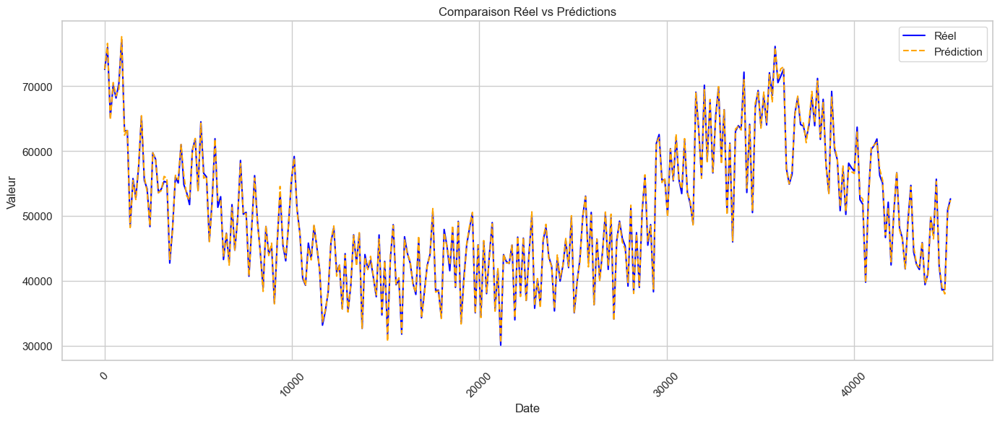

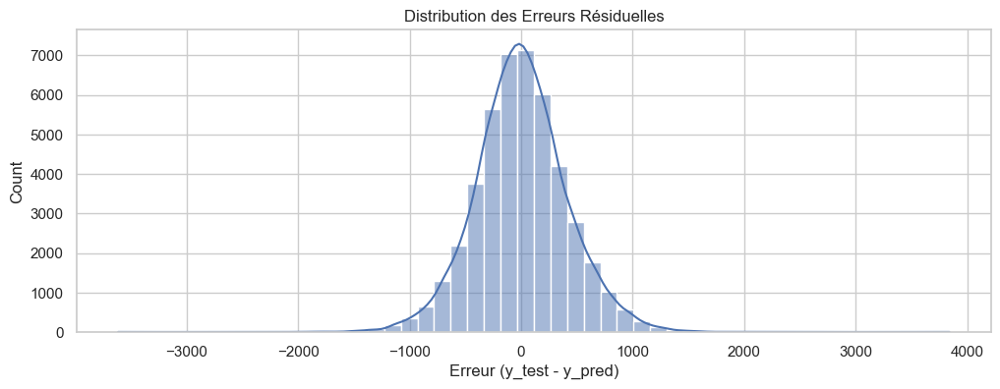


🧠 --- Analyse de l'optimisation Optuna ---



✅ Tous les modèles ont été testés.


In [17]:
# Boucle sur chaque modèle
results_all_models = {}

for model_name, (model_fn, search_space_fn) in models_to_test.items():
    print(f"\n📦 Traitement du modèle : {model_name}")

    use_optuna = search_space_fn is not None  # Utiliser Optuna seulement si un espace de recherche est défini

    model, cv_results = full_train_evaluate_pipeline(
        model_fn=model_fn,
        X=X_train,
        y=y_train,
        params=None if use_optuna else {},
        search_space_fn=search_space_fn,
        threshold_rmse=300,
        use_optuna=use_optuna,
        n_trials=30,
        run_name=f"{model_name}_Run",
        validation_type="time_series_cv",  # ou "walk_forward" si tu veux tester en dynamique
        n_splits=5,
        storage_url="sqlite:///optuna_study.db",
        generate_report=True,
        datetimes=X_train.index,
        X_test=X_test,
        y_test=y_test
    )
    
    best_params = None
    mean_rmse_final = None
    try:
        with open("results.json", "r") as f:
            all_runs = json.load(f)
        last_run = [r for r in all_runs if r["run_name"] == f"{model_name}_Run"][-1]
        best_params = last_run.get("params", {})
        mean_rmse_final = last_run.get("mean_rmse_final", None)
    except Exception as e:
        print(f"Erreur de lecture des logs pour {model_name}: {e}")

    # Sauvegarde du modèle
    model_save_path = f"saved_models/{model_name}_model.pkl"
    os.makedirs("saved_models", exist_ok=True)
    joblib.dump(model, model_save_path)

    # Stocker dans l'historique
    results_all_models[model_name] = {
        "model": model,
        "cv_results": cv_results,
        "best_params": best_params,
        "run_name": f"{model_name}_Run",
        "mean_rmse_final": mean_rmse_final,
        "saved_model_path": model_save_path
    }

print("\n✅ Tous les modèles ont été testés.")

In [18]:
# Comparaison des résultats
summary = []

for model_name, info in results_all_models.items():
    summary.append({
        "Modèle": model_name,
        "RMSE Final": info["mean_rmse_final"],
        "Chemin Sauvegarde": info["saved_model_path"],
        "Best Params": info["best_params"]
    })

df_summary = pd.DataFrame(summary)
display(df_summary.sort_values("RMSE Final"))

,Modèle,RMSE Final,Chemin Sauvegarde,Best Params
3,RandomForest,539.429089,saved_models/RandomForest_model.pkl,"{'n_estimators': 257, 'max_depth': 26, 'min_sa..."
6,LightGBM,542.662967,saved_models/LightGBM_model.pkl,"{'n_estimators': 588, 'max_depth': 12, 'learni..."
7,CatBoost,552.559246,saved_models/CatBoost_model.pkl,"{'iterations': 1354, 'depth': 6, 'learning_rat..."
5,XGBoost,563.279695,saved_models/XGBoost_model.pkl,"{'n_estimators': 180, 'max_depth': 10, 'learni..."
1,Ridge,782.699244,saved_models/Ridge_model.pkl,{'alpha': 0.6120845292082013}
0,LinearRegression,783.173776,saved_models/LinearRegression_model.pkl,{}
2,Lasso,783.678522,saved_models/Lasso_model.pkl,{'alpha': 0.00010015184472655845}
4,KNN,1433.942321,saved_models/KNN_model.pkl,"{'n_neighbors': 17, 'weights': 'distance', 'p'..."


## EXPLORATION DES MODÈLES (DEPRECATED)

In [12]:
from src.utils import (
    plot_residual_errors,
    plot_model_predictions
)
from src.model_training import (
    train_linear_model, 
    train_random_forest, 
    save_model, 
    get_all_models
)
from src.evaluation import (
    evaluate_model, 
    print_evaluation_metrics, 
    evaluate_model_timeseries_cv, 
    print_cv_results
)

### 1. REGRESSION LINÉAIRE

In [13]:
from sklearn.linear_model import LinearRegression

In [14]:
pd.DataFrame(X_train, columns=train[features_to_use].columns)

,Consommation_lag_1,Consommation_lag_2,Consommation_lag_3,Consommation_rolling_mean_3,Type de jour TEMPO_BLANC,Type de jour TEMPO_BLEU,Type de jour TEMPO_ROUGE,day,dayofyear,hour_cos,hour_sin,hour_transformed,is_end_of_month,is_weekend,month,quarter,weekday,weekofyear,year
0,-0.730466,-0.676273,-0.892576,-0.768814,False,True,False,-1.665751,0.532818,1.414280,-0.000165,-1.661211,False,False,0.672577,0.397133,-1.499241,0.579844,-1.829453
1,-0.783703,-0.730458,-0.676263,-0.732405,False,True,False,-1.665751,0.532818,1.414280,-0.000165,-1.661211,False,False,0.672577,0.397133,-1.499241,0.579844,-1.829453
2,-0.968568,-0.783696,-0.730449,-0.830138,False,True,False,-1.665751,0.532818,1.366092,0.365868,-1.516741,False,False,0.672577,0.397133,-1.499241,0.579844,-1.829453
3,-1.204948,-0.968563,-0.783687,-0.988790,False,True,False,-1.665751,0.532818,1.366092,0.365868,-1.516741,False,False,0.672577,0.397133,-1.499241,0.579844,-1.829453
4,-1.259219,-1.204946,-0.968556,-1.147789,False,True,False,-1.665751,0.532818,1.224815,0.706956,-1.372271,False,False,0.672577,0.397133,-1.499241,0.579844,-1.829453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180495,2.123063,2.170481,2.217209,2.176979,False,False,True,-0.757745,-1.686896,-0.999884,-1.000186,0.505834,False,False,-1.639455,-1.386191,-0.999324,-1.666947,1.678143
180496,2.079991,2.123101,2.170518,2.131123,False,False,True,-0.757745,-1.686896,-0.706997,-1.224935,0.650304,False,False,-1.639455,-1.386191,-0.999324,-1.666947,1.678143
180497,2.077838,2.080028,2.123138,2.100159,False,False,True,-0.757745,-1.686896,-0.706997,-1.224935,0.650304,False,False,-1.639455,-1.386191,-0.999324,-1.666947,1.678143
180498,2.057766,2.077875,2.080065,2.078325,False,False,True,-0.757745,-1.686896,-0.706997,-1.224935,0.650304,False,False,-1.639455,-1.386191,-0.999324,-1.666947,1.678143


In [15]:
linear_results_cv = evaluate_model_timeseries_cv(LinearRegression(), pd.DataFrame(X_train), y_train)
print_cv_results(linear_results_cv)


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.994195     0.994654     0.994443     0.995663     0.996530     0.995097
RMSE       |   926.242494   864.646736   853.584096   762.752211   509.779737   783.401055
MAE        |   666.045974   616.407069   626.005375   551.869942   387.080097   569.481691
MAPE       |     1.253678     1.184247     1.193291     1.064312     0.861756     1.111457


In [16]:
linear_model = train_linear_model(X_train, y_train)
metrics_linear = evaluate_model(linear_model, X_test, y_test)
print_evaluation_metrics(metrics_linear)

Évaluation du modèle :
R2: 0.9976756180124087
RMSE: 502.92162877193783
MAE: 386.1042355905618
MAPE: 0.7879423287168437


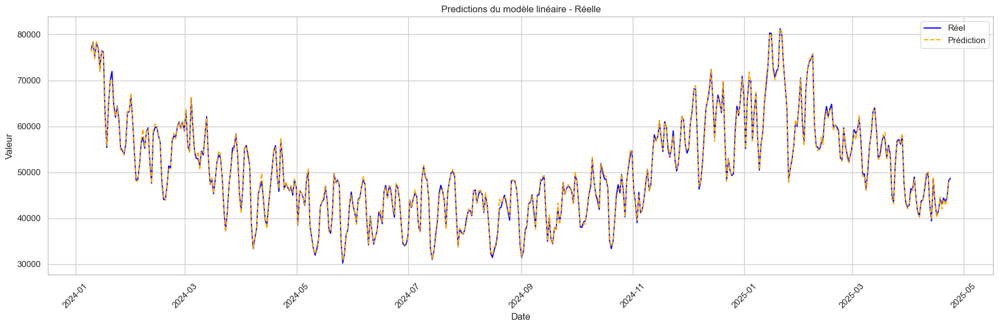

In [17]:
plot_model_predictions(y_test, linear_model.predict(X_test), test['Datetime'], title="Predictions du modèle linéaire - Réelle", figsize=(18, 6), num_points=500)

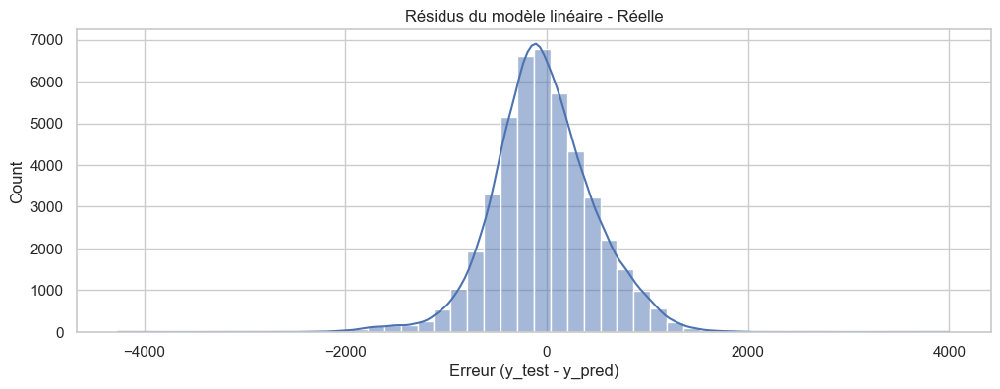

In [18]:
plot_residual_errors(y_test, linear_model.predict(X_test), title="Résidus du modèle linéaire - Réelle")

### 2. RIDGE

In [19]:
from sklearn.linear_model import Ridge
from src.model_training import train_ridge_model

In [20]:
ridge_results_cv = evaluate_model_timeseries_cv(Ridge(), pd.DataFrame(X_train), y_train)
print_cv_results(ridge_results_cv)


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.994220     0.994647     0.994457     0.995660     0.996529     0.995103
RMSE       |   924.244602   865.248402   852.478412   763.032773   509.787792   782.958396
MAE        |   663.284970   616.759128   623.375281   552.167069   387.317068   568.580703
MAPE       |     1.246729     1.185282     1.186489     1.064975     0.862399     1.109175


In [21]:
ridge = train_ridge_model(X_train, y_train)
metrics_ridge = evaluate_model(ridge, X_test, y_test)
print_evaluation_metrics(metrics_ridge)

Évaluation du modèle :
R2: 0.9976873713229335
RMSE: 501.6484978197453
MAE: 384.62553787498877
MAPE: 0.784231825006736


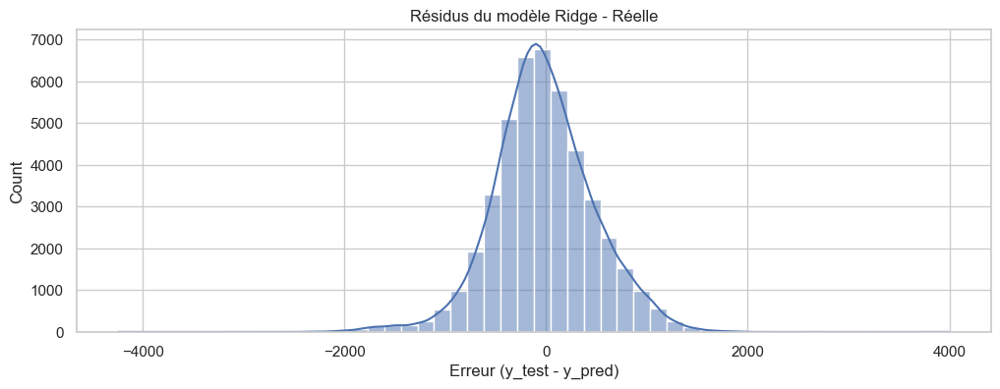

In [22]:
plot_residual_errors(y_test, ridge.predict(X_test), title="Résidus du modèle Ridge - Réelle")

### 3. Lasso

In [23]:
from sklearn.linear_model import Lasso
from src.model_training import train_lasso_model

In [24]:
lasso_results_cv = evaluate_model_timeseries_cv(Lasso(), pd.DataFrame(X_train), y_train)
print_cv_results(lasso_results_cv)

c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.011e+09, tolerance: 3.911e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.152e+09, tolerance: 8.391e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of 


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.994216     0.994618     0.994416     0.995610     0.996579     0.995088
RMSE       |   924.524626   867.583654   855.650147   767.453053   506.166001   784.275496
MAE        |   663.685257   618.493941   624.197369   556.265229   385.582609   569.644881
MAPE       |     1.247513     1.188185     1.184860     1.072333     0.859092     1.110397


c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.991e+10, tolerance: 2.071e+09
  model = cd_fast.enet_coordinate_descent(


In [25]:
lasso = train_ridge_model(X_train, y_train)
metrics_lasso = evaluate_model(lasso, X_test, y_test)
print_evaluation_metrics(metrics_lasso)

Évaluation du modèle :
R2: 0.9976873713229335
RMSE: 501.6484978197453
MAE: 384.62553787498877
MAPE: 0.784231825006736


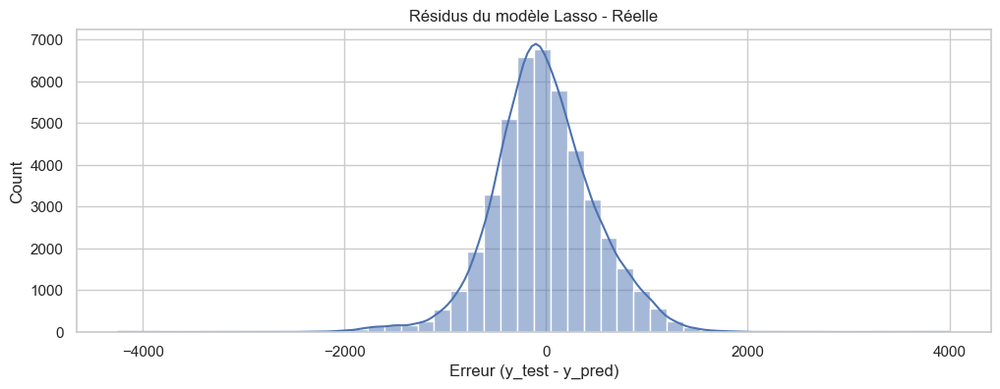

In [26]:
plot_residual_errors(y_test, lasso.predict(X_test), title="Résidus du modèle Lasso - Réelle")

### 4. RANDOM FOREST

In [39]:
from sklearn.ensemble import RandomForestRegressor
from src.model_training import train_random_forest

In [40]:
random_forest_results_cv = evaluate_model_timeseries_cv(RandomForestRegressor(), pd.DataFrame(X_train), y_train)
print_cv_results(random_forest_results_cv)


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.998050     0.998460     0.998068     0.997864     0.994118     0.997312
RMSE       |   536.859144   464.105764   503.279628   535.347084   663.670474   540.652418
MAE        |   374.977174   314.050417   350.277570   358.155426   498.168743   379.125866
MAPE       |     0.690447     0.594650     0.669052     0.678596     1.116423     0.749833


In [41]:
random_forest = train_random_forest(X_train, y_train)
metrics_random_forest = evaluate_model(random_forest, X_test, y_test)
print_evaluation_metrics(metrics_random_forest)

Évaluation du modèle :
R2: 0.9984565685981506
RMSE: 409.81724431656005
MAE: 306.9979860834108
MAPE: 0.6085023058995676


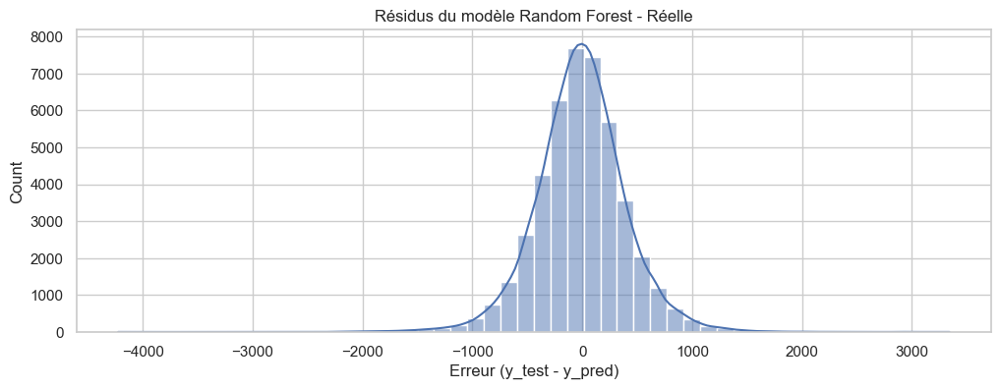

In [42]:
plot_residual_errors(y_test, random_forest.predict(X_test), title="Résidus du modèle Random Forest - Réelle")

### 5. KNN

In [27]:
from sklearn.neighbors import KNeighborsRegressor
from src.model_training import train_knn_model

In [28]:
knn_results_cv = evaluate_model_timeseries_cv(KNeighborsRegressor(), pd.DataFrame(X_train), y_train)
print_cv_results(knn_results_cv)


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.973243     0.978974     0.968745     0.971148     0.936701     0.965762
RMSE       |  1988.556077  1714.757104  2024.299814  1967.420548  2177.150832  1974.436875
MAE        |  1414.057641  1302.214473  1548.639830  1469.533777  1772.116006  1501.312345
MAPE       |     2.528187     2.465096     2.957377     2.812224     3.905289     2.933635


In [29]:
knn = train_knn_model(X_train, y_train)
metrics_knn = evaluate_model(knn, X_test, y_test)
print_evaluation_metrics(metrics_knn)

Évaluation du modèle :
R2: 0.9715745243829514
RMSE: 1758.7351067684458
MAE: 1351.0572707530027
MAPE: 2.6642987462858314


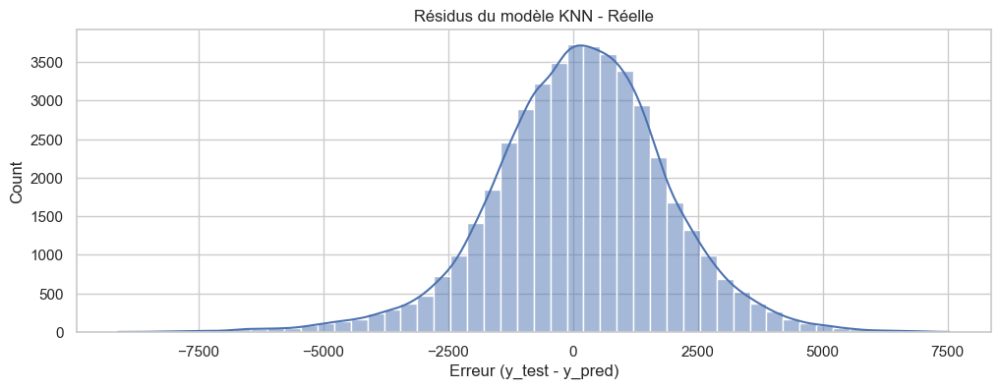

In [30]:
plot_residual_errors(y_test, knn.predict(X_test), title="Résidus du modèle KNN - Réelle")

### XGBOOST

In [31]:
from xgboost import XGBRegressor
from src.model_training import train_xgboost_model

In [32]:
xgboost_results_cv = evaluate_model_timeseries_cv(XGBRegressor(), pd.DataFrame(X_train), y_train)
print_cv_results(xgboost_results_cv)


Validation croisée (TimeSeriesSplit)
------------------------------------
Metric     |       Fold 1       Fold 2       Fold 3       Fold 4       Fold 5      Moyenne 
--------------------------------------------------------------------------------------------------
R2         |     0.997080     0.997701     0.997678     0.997579     0.994443     0.996896
RMSE       |   656.884241   567.010609   551.725985   569.957729   645.078072   598.131327
MAE        |   424.584717   398.582062   409.534943   413.462616   482.410583   425.714984
MAPE       |     0.770787     0.752298     0.784935     0.785739     1.081656     0.835083


In [33]:
xgboost = train_xgboost_model(X_train, y_train)
metrics_xgboost = evaluate_model(xgboost, X_test, y_test)
print_evaluation_metrics(metrics_xgboost)

Évaluation du modèle :
R2: 0.9973702430725098
RMSE: 534.937846856997
MAE: 414.4886779785156
MAPE: 0.828149853145371


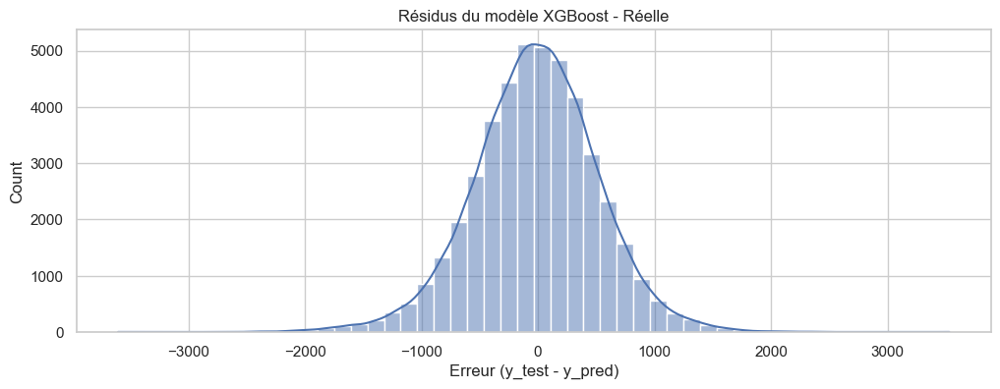

In [34]:
plot_residual_errors(y_test, xgboost.predict(X_test), title="Résidus du modèle XGBoost - Réelle")

## Analyse

In [19]:
from src.explainer import explain_linear_model_shap

In [20]:
X_train_original = X_train.copy()
X_train_original[features_to_scale]= scaler.inverse_transform(X_train_original[features_to_scale])
X_test_original = X_test.copy()
X_test_original[features_to_scale]= scaler.inverse_transform(X_test_original[features_to_scale])
# 🔧 Forcer tous les types en float64 pour compatibilité SHAP
X_train_original = X_train_original.astype('float64')
X_test_original = X_test_original.astype('float64')

Création de l'explainer SHAP pour modèle linéaire...
Calcul des valeurs SHAP...


c:\Users\hakim\OneDrive - Ifag Paris\MSPR823-4\.venv\Lib\site-packages\shap\explainers\_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


Affichage des plots SHAP...


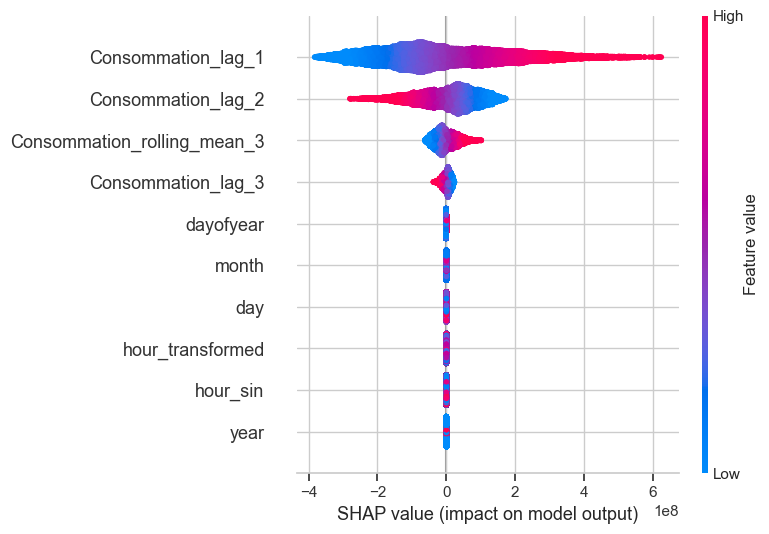

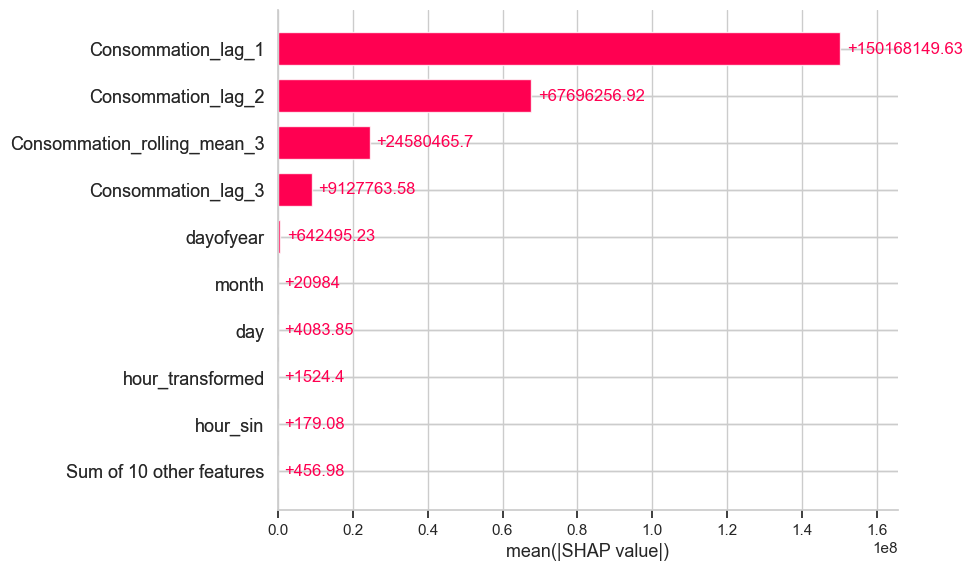

Explication locale pour l'observation 0


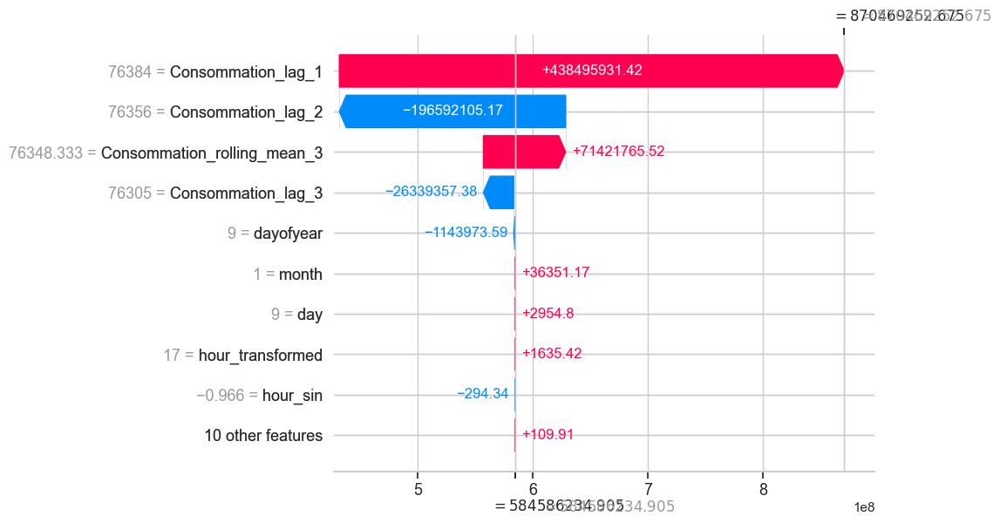

In [21]:
shap_values = explain_linear_model_shap(linear_model, X_train_original, X_test_original)

TODO :
AJouter les donnée méteo :
- script qui télécharge les donnée
- script de nettoyage
    - aggrégation par jour ?
    - moyenne de température de la FRANCE
    
- jointure avec eco2mix
    - analyse de la donnée final pour s'assurer qu'elle est viable (suffisament de lignes)
Explorer à l'aide optuna l'hyperparamétrage
EXplorer un premier model de deep